## Setup, Loading Data and CDFs

In [11]:
DATA_NAME = 'coco-outdoor' 
TRANSFORM = 'gabor'
CHANNEL = ''

In [12]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
gabor_outdoor_coco.ipynb


In [13]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'/Users/michaelmurphy/Documents/GitHub/hierarchical-bayesian-model-validation/results/case-studies/coco/outdoor/gabor'

In [14]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [15]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))
# nonskewed_df = pd.read_csv(os.path.join(ROOT_DIR, 'learned-filters', 'nonskewed_filter_idxs_df.csv')).set_index(['dataset', 'num_images', 'num_bootstrap'])
# nonskewed_filter_idxs = eval(nonskewed_df.loc[DATA_NAME].sort_values('num_images', ascending=False)['nonskewed_filter_idxs'].iloc[0])

# TODO: treat all as nonskewed for now
nonskewed_filter_idxs = list(group_data_map.keys())
# nonskewed_filter_idxs = list(np.array(list(group_data_map.keys())) + 1)


# filter_group_map = (pd.read_csv(os.path.join(ROOT_DIR, "gabor", "gabor_full.csv"), index_col="index")
#        .loc[:, ["wave_number", "aspect_ratio", "frequency"]]
#        .apply(tuple, axis=1)
#        .to_dict())

# TODO: currently gabor_full has idxs 1, 2, 3, ... need to switch to 0, 1, 2, ...
# map of filter index to tuple of filter parameters (wave_number, aspect_ratio, frequency)

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", "gabor_full.csv"), index_col="index")
df = df.sort_index()
df.index = df.index.astype(int) - 1

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.001),
 1: (2.0, 0.5, 0.002),
 2: (2.0, 0.5, 0.003),
 3: (2.0, 0.5, 0.004),
 4: (2.0, 0.5, 0.005),
 5: (2.0, 0.5, 0.009),
 6: (2.0, 0.5, 0.014),
 7: (2.0, 0.5, 0.022),
 8: (2.0, 0.5, 0.034),
 9: (2.0, 0.5, 0.054),
 10: (2.0, 0.5, 0.084),
 11: (2.0, 0.5, 0.132),
 12: (2.0, 0.5, 0.205),
 13: (2.0, 0.5, 0.32),
 14: (2.0, 0.5, 0.5),
 15: (2.0, 1.0, 0.001),
 16: (2.0, 1.0, 0.002),
 17: (2.0, 1.0, 0.003),
 18: (2.0, 1.0, 0.004),
 19: (2.0, 1.0, 0.005),
 20: (2.0, 1.0, 0.009),
 21: (2.0, 1.0, 0.014),
 22: (2.0, 1.0, 0.022),
 23: (2.0, 1.0, 0.034),
 24: (2.0, 1.0, 0.054),
 25: (2.0, 1.0, 0.084),
 26: (2.0, 1.0, 0.132),
 27: (2.0, 1.0, 0.205),
 28: (2.0, 1.0, 0.32),
 29: (2.0, 1.0, 0.5),
 30: (3.0, 0.5, 0.001),
 31: (3.0, 0.5, 0.002),
 32: (3.0, 0.5, 0.003),
 33: (3.0, 0.5, 0.004),
 34: (3.0, 0.5, 0.005),
 35: (3.0, 0.5, 0.009),
 36: (3.0, 0.5, 0.014),
 37: (3.0, 0.5, 0.022),
 38: (3.0, 0.5, 0.034),
 39: (3.0, 0.5, 0.054),
 40: (3.0, 0.5, 0.084),
 41: (3.0, 0.5, 0.132),
 42: (3.

In [16]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 196608000,
 1: 196608000,
 2: 196608000,
 3: 196608000,
 4: 196608000,
 5: 196608000,
 6: 196608000,
 7: 196608000,
 8: 196608000,
 9: 196608000,
 10: 196608000,
 11: 196608000,
 12: 196608000,
 13: 196608000,
 14: 196608000,
 15: 196608000,
 16: 196608000,
 17: 196608000,
 18: 196608000,
 19: 196608000}

Running 12760 CDFs


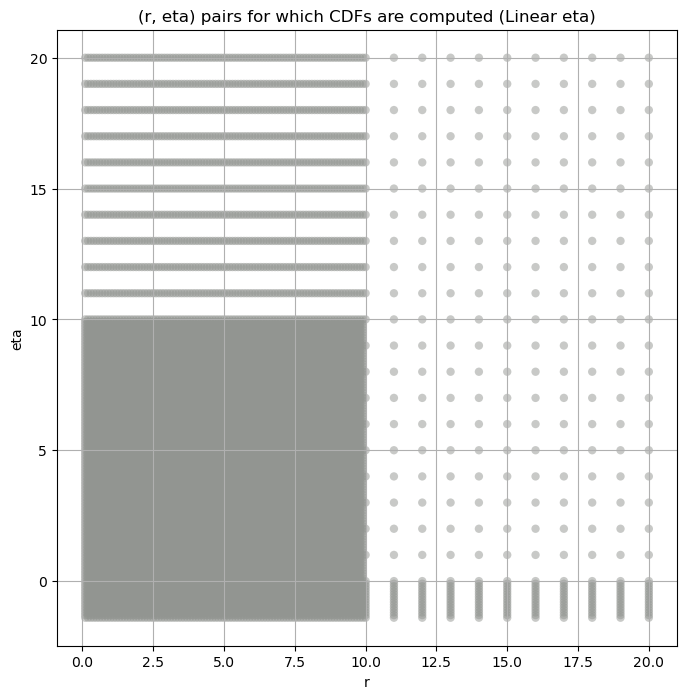

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [17]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [18]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [19]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]

        #TODO: currently setting filter group map to a string version of the tuple of parameters
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,63.548928,48.379970,80.931687,7.165057,3.826848,16.333108,196608000.0,"(2.0, 0.5, 0.001)"
1,16.307660,12.305715,21.730621,9.287096,4.682542,24.351610,196608000.0,"(2.0, 0.5, 0.002)"
2,4.202337,3.154458,5.660183,11.389939,5.542621,32.844753,196608000.0,"(2.0, 0.5, 0.003)"
3,1.123752,0.816141,1.521846,13.253161,6.340989,35.143394,196608000.0,"(2.0, 0.5, 0.004)"
4,0.309677,0.218014,0.412613,14.076481,7.350612,39.435435,196608000.0,"(2.0, 0.5, 0.005)"
5,96.367710,74.343195,121.855985,7.973325,3.719243,21.967798,196608000.0,"(2.0, 0.5, 0.009)"
6,24.910594,18.300485,33.594873,10.619910,5.240451,35.423319,196608000.0,"(2.0, 0.5, 0.014)"
7,6.427431,4.737144,8.874136,13.242025,6.263086,43.162268,196608000.0,"(2.0, 0.5, 0.022)"
8,1.678274,1.163611,2.391877,15.821607,6.910286,52.082524,196608000.0,"(2.0, 0.5, 0.034)"


## Initial Grid Search and Hypothesis Test Plots

In [20]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [21]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,63.548928,63.548928,60.635028,58.739322,55.804131
1,16.307660,16.307660,15.429657,14.884829,14.044279
2,4.202337,4.202337,3.947509,3.789414,3.547987
3,1.123752,1.123752,1.048596,1.003122,0.933771
4,0.309677,0.309677,0.288220,0.275061,0.255086
5,96.367710,96.367710,91.474841,88.432490,83.779436
6,24.910594,24.910594,23.416082,22.522171,21.163365
7,6.427431,6.427431,5.989455,5.726934,5.332508
8,1.678274,1.678274,1.550704,1.476107,1.363930


####
Filter_idx  0


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.00629593013632869 63.54892825500126


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.006421306979227492 60.63502839929674


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.007380377252141579 58.73932196637054


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.008243308245485026 55.804130960734696
Number of samples: 100000, Without approximation : 196608000.0


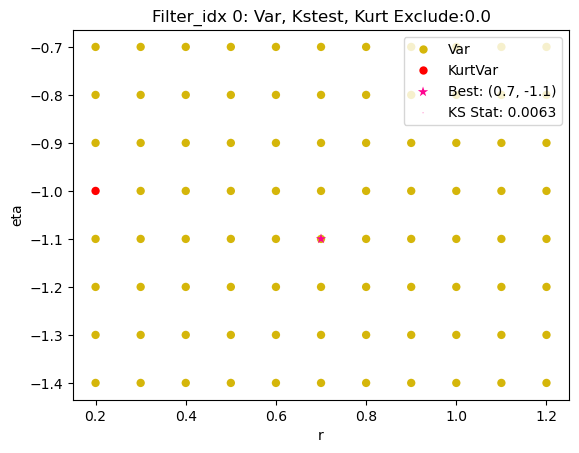

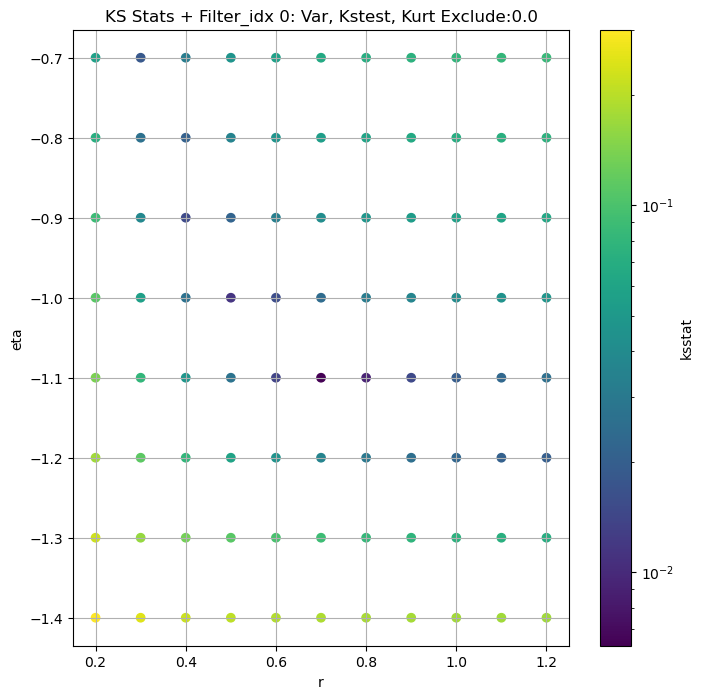

####
Filter_idx  1


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.007763664389081493 16.307660101522654


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.007825769766437618 15.429657364670868


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.008514159800558696 14.884828841982044


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.009712813524620278 14.04427946699594
Number of samples: 100000, Without approximation : 196608000.0


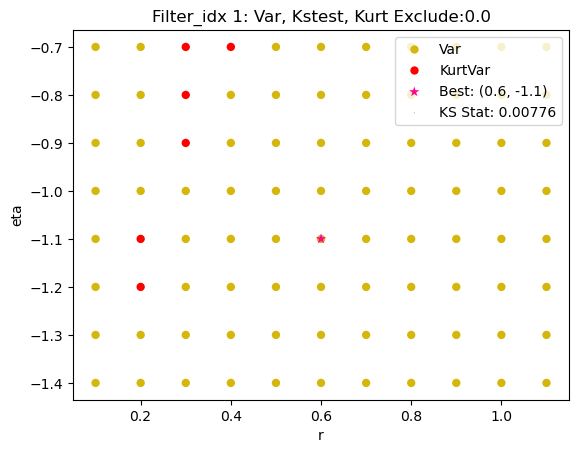

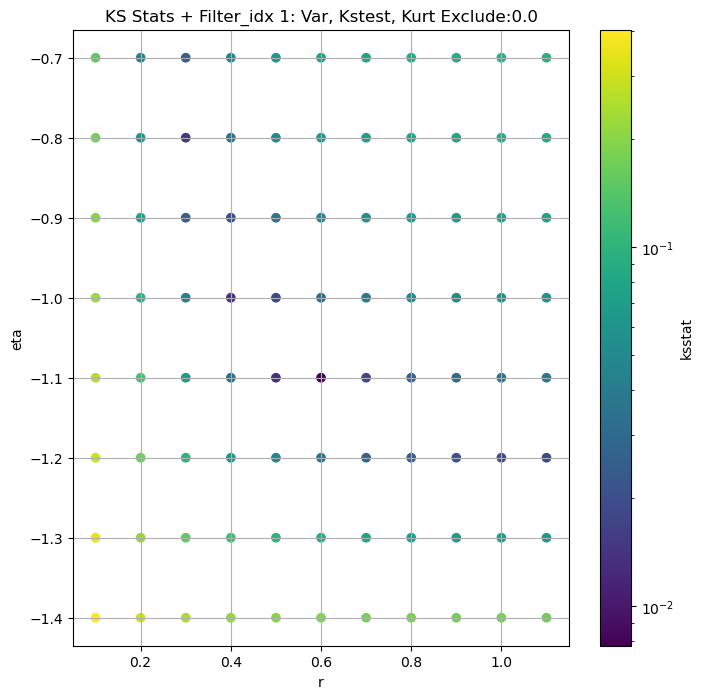

####
Filter_idx  2


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.008365199578926563 4.202337210840184


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.009880864443120724 3.9475090817694185


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.010391380404675132 3.7894142220592717


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.00900838802029369 3.547986651056669
Number of samples: 100000, Without approximation : 196608000.0


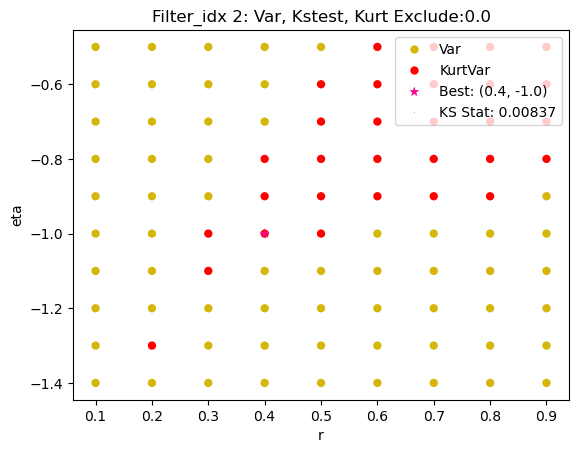

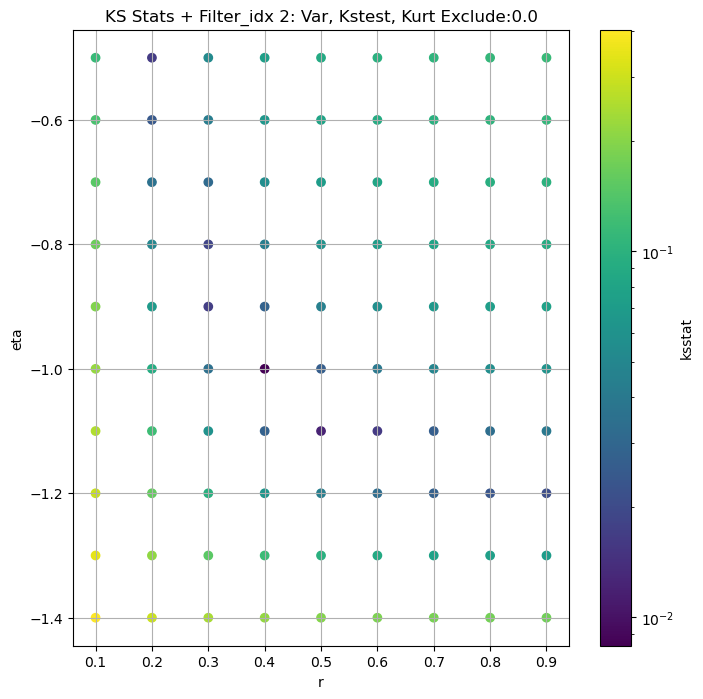

####
Filter_idx  3


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.009993163198157462 1.1237520334032551


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.009969866272417471 1.0485963364861686


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.009969863274858715 1.0031215570972725


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.010390194129745345 0.933771069636756
Number of samples: 100000, Without approximation : 196608000.0


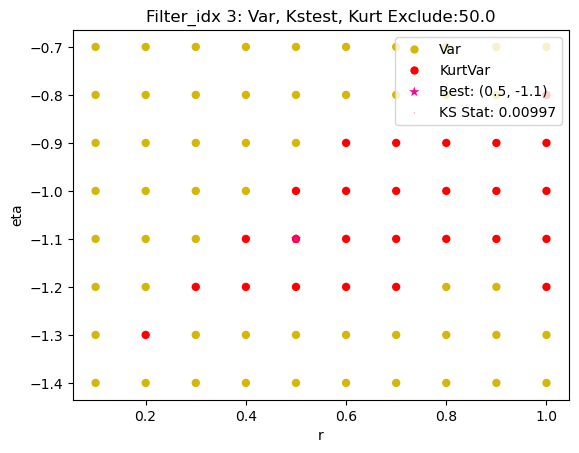

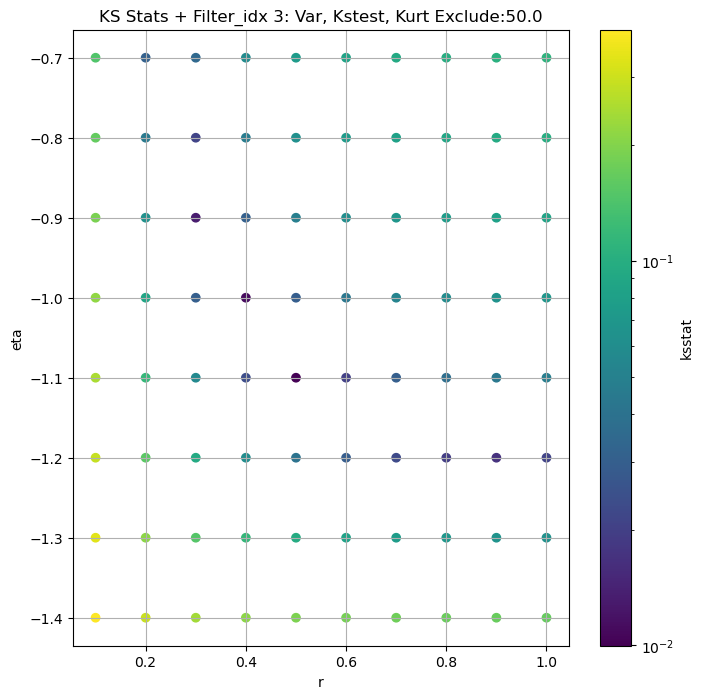

####
Filter_idx  4


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.012721987008942781 0.3096766359264535


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.013788405178807889 0.28822041316088964


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.01410425255175296 0.2750614728896792


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.012723493870241964 0.2550857592833657
Number of samples: 100000, Without approximation : 196608000.0


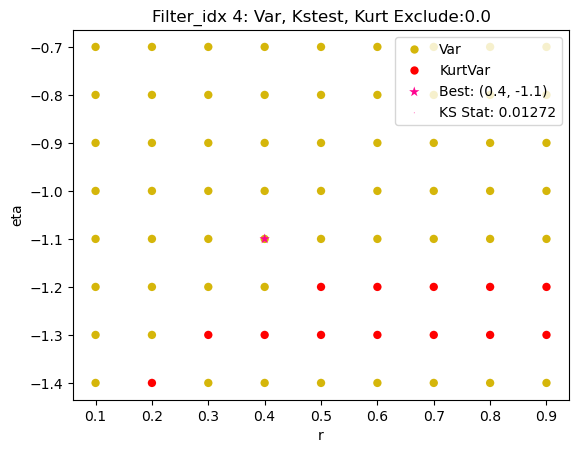

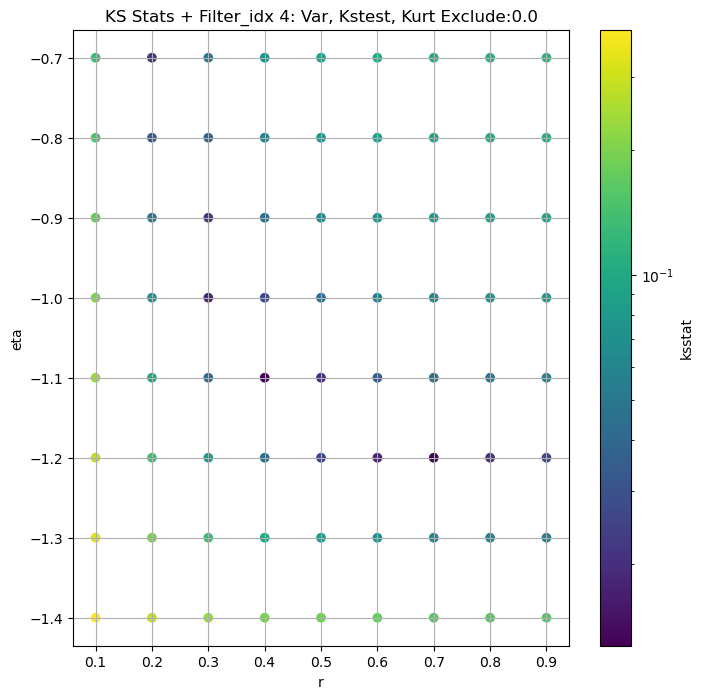

####
Filter_idx  5


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.0045010879590484665 96.3677100883937


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.006513762646319449 91.4748407264935


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.006659972318441287 88.43249010737598


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.007782413916775144 83.77943612061623
Number of samples: 100000, Without approximation : 196608000.0


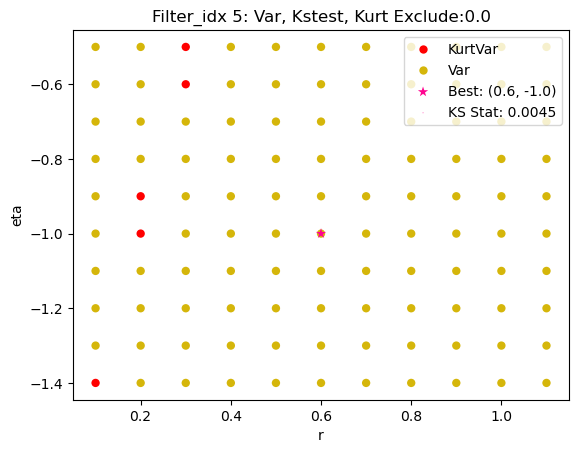

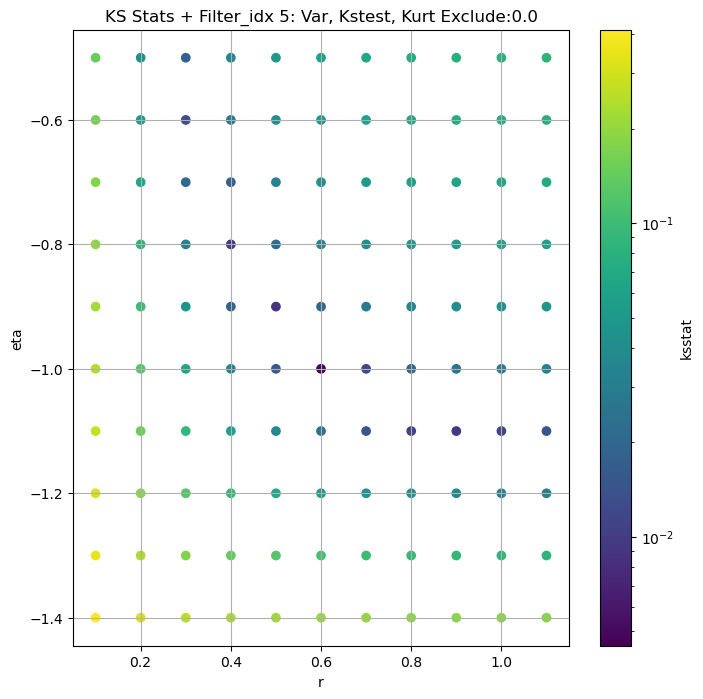

####
Filter_idx  6


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.008275996986059964 24.910593631133633


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.00705954241177964 23.4160815315743


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.0064153516842644365 22.522171307340262


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.007162802424732884 21.16336517556334
Number of samples: 100000, Without approximation : 196608000.0


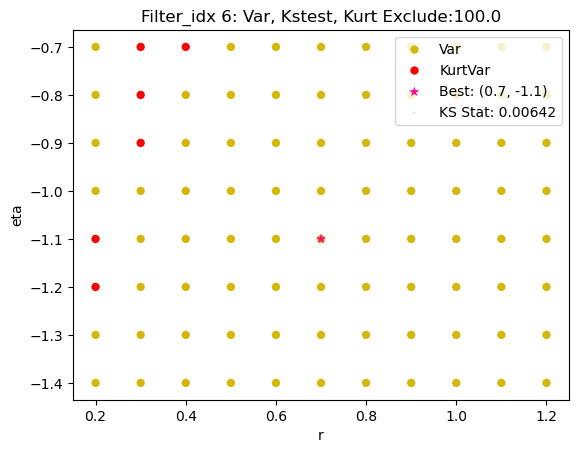

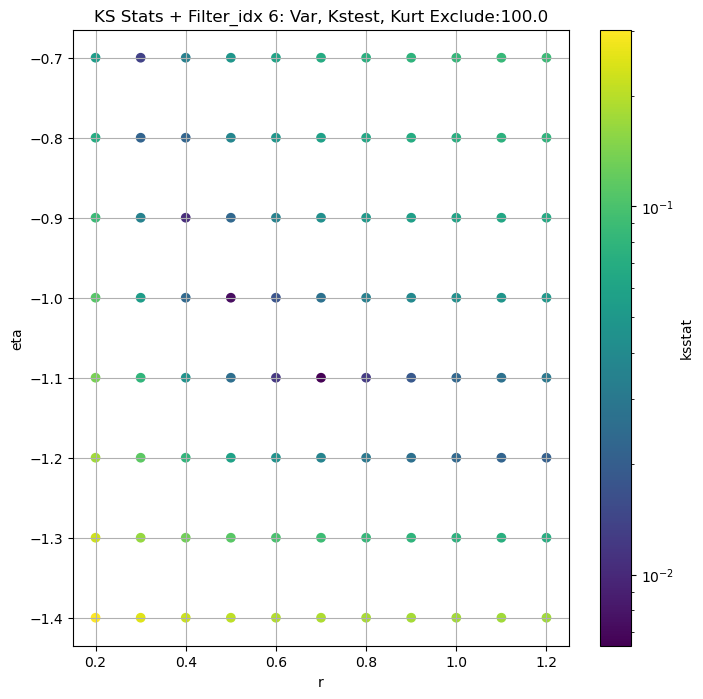

####
Filter_idx  7


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.00666941659634962 6.427431168576379


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.008861327004906605 5.989455179991189


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.00948385864280632 5.726934266392751


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.01059347954777562 5.332507983356419
Number of samples: 100000, Without approximation : 196608000.0


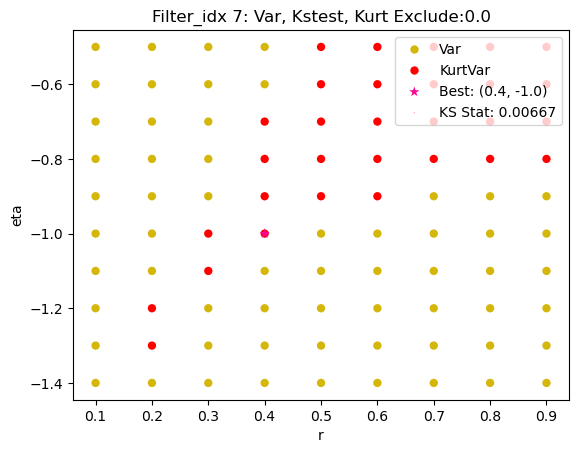

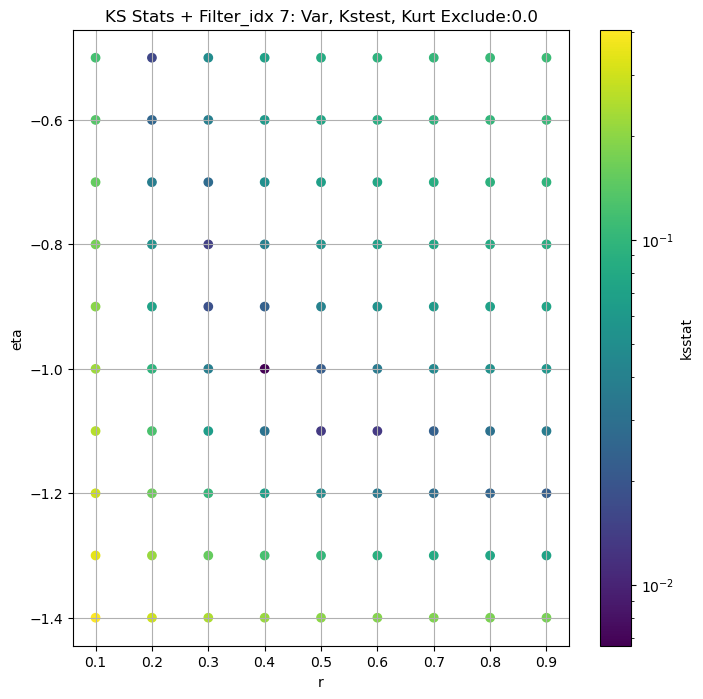

####
Filter_idx  8


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.008940642184502634 1.6782738892039424


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.008009999999994966 1.5507035570288983


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.008009999999994855 1.4761070816318553


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.009575078985555763 1.363930110153597
Number of samples: 100000, Without approximation : 196608000.0


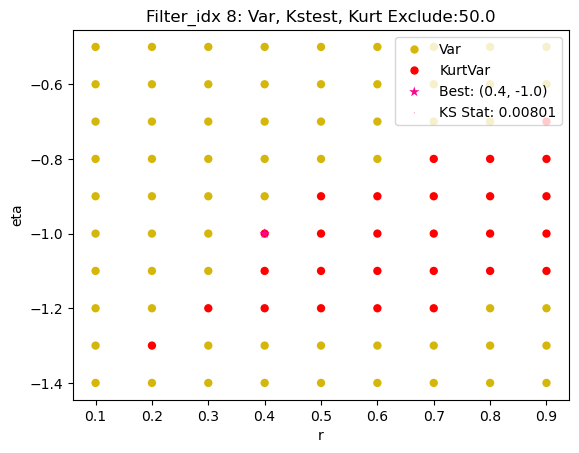

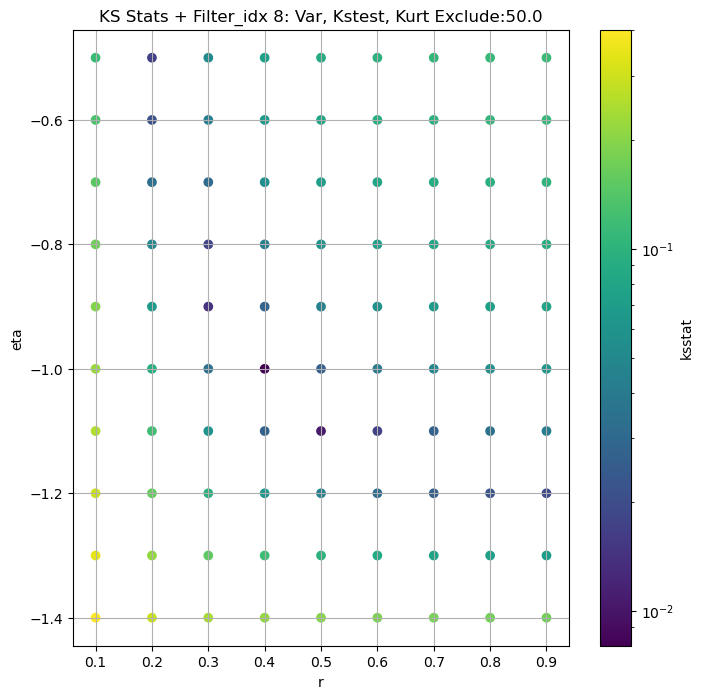

####
Filter_idx  9


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.014034713243232466 0.4670565741882759


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.010053282209565917 0.4280521867207004


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.010052012039157843 0.4056921176360565


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.010049924388570552 0.3725704354609116
Number of samples: 100000, Without approximation : 196608000.0


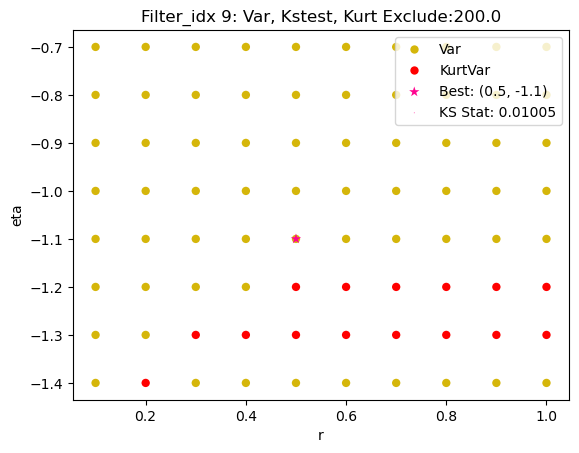

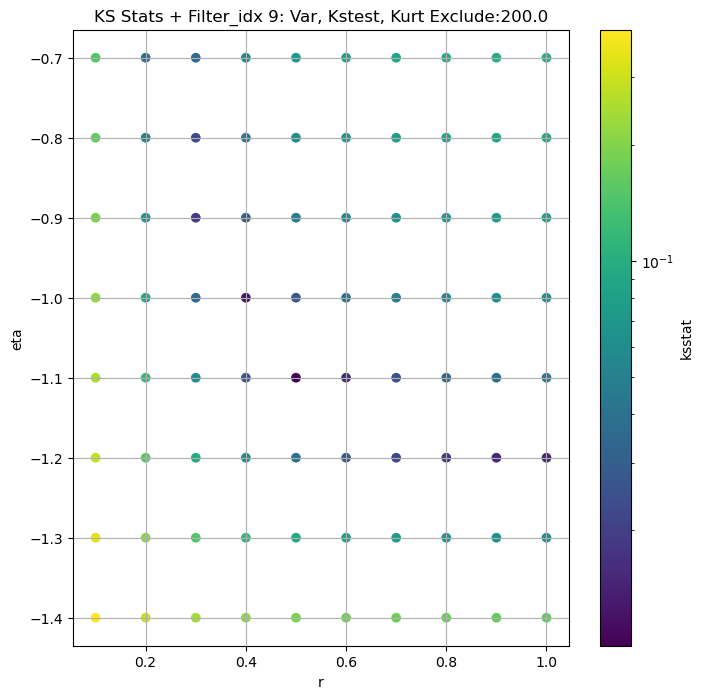

####
Filter_idx  10


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.0064561093580014495 69.3721851998416


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.008624882916084875 65.47044064444354


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.010573154701892351 63.088566948295394


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.009413168651470905 59.49956190439139
Number of samples: 100000, Without approximation : 196608000.0


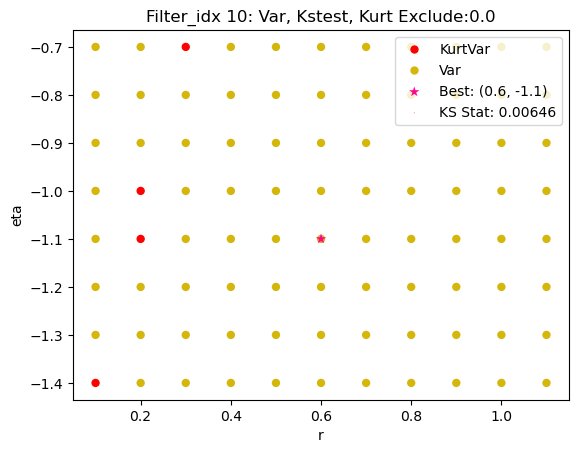

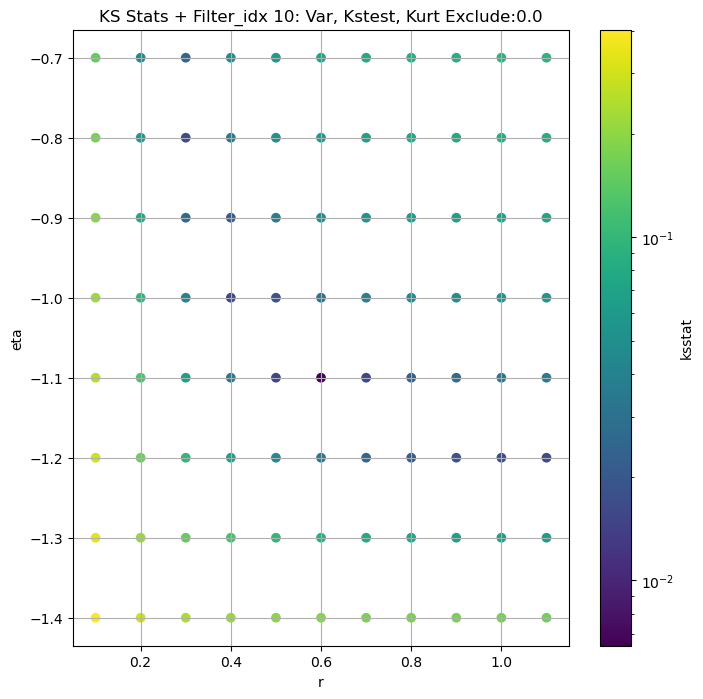

####
Filter_idx  11


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.009291333553604675 17.442214413404848


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.007241129773603139 16.244872192977397


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.009140368433024557 15.569018287014021


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.012388139516175803 14.562697887930302
Number of samples: 100000, Without approximation : 196608000.0


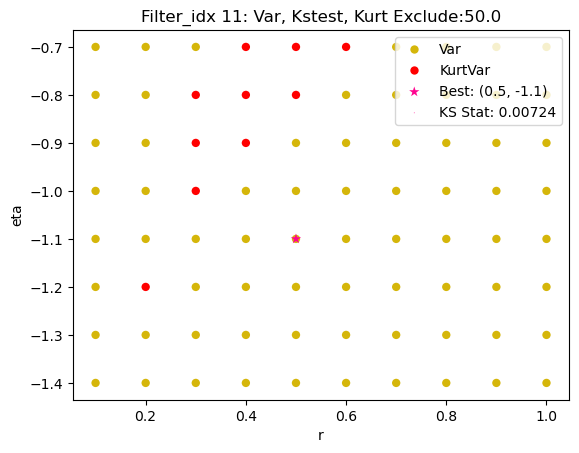

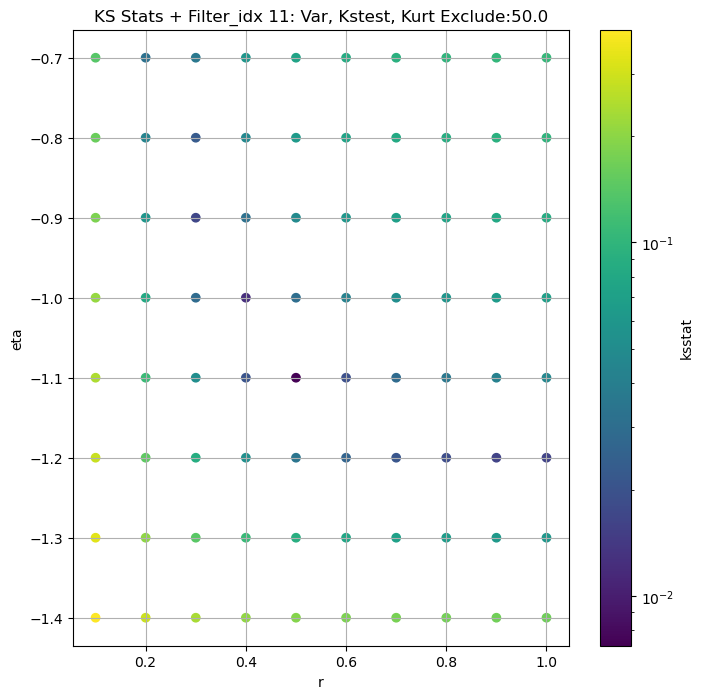

####
Filter_idx  12


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.012877181665418125 4.405970250088933


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.011379225883453192 4.07721508207107


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.011678294811222817 3.88571961435009


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.008046053832034938 3.6014472107411017
Number of samples: 100000, Without approximation : 196608000.0


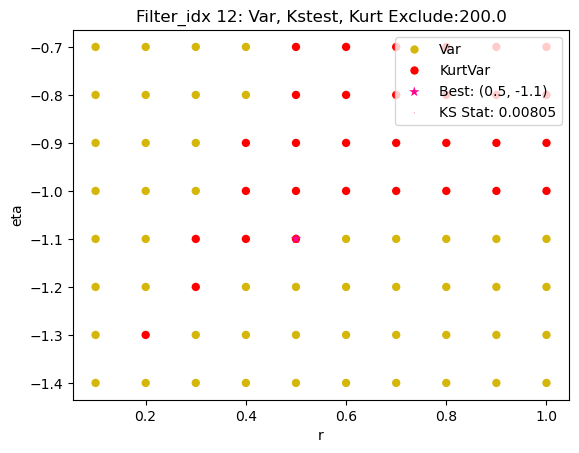

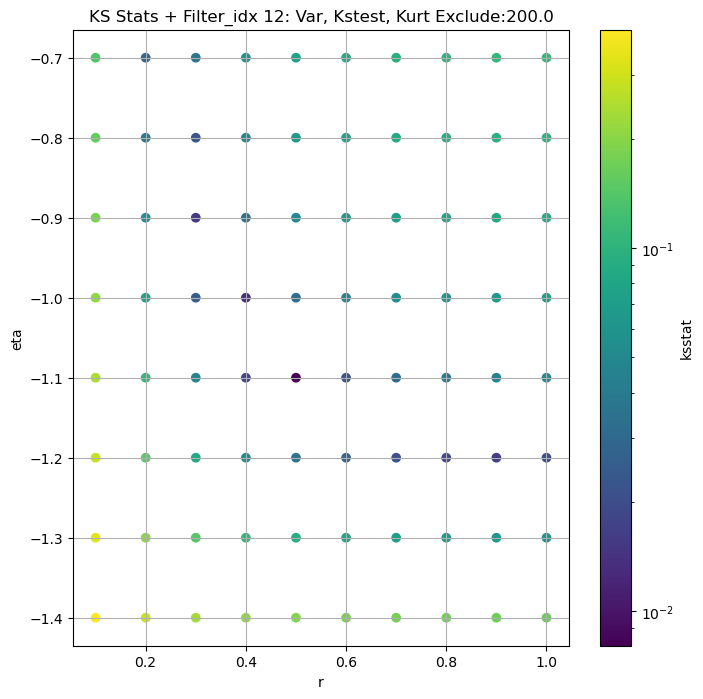

####
Filter_idx  13


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.007632849045906109 1.170050214515642


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.009548293580868394 1.0752269392406717


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.01079371658234185 1.0210027729816027


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.011840718732955877 0.9404768207128319
Number of samples: 100000, Without approximation : 196608000.0


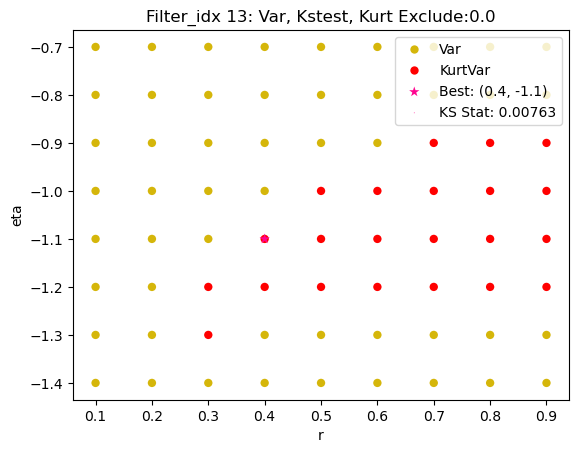

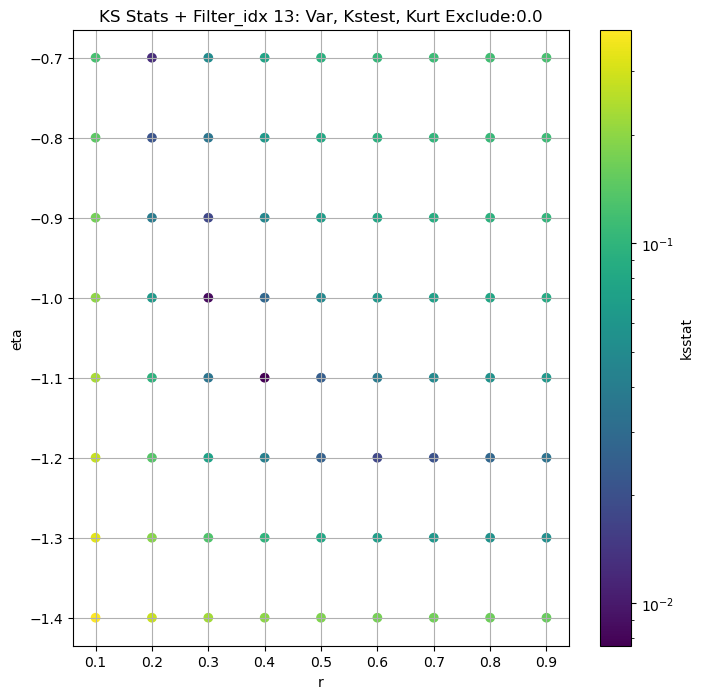

####
Filter_idx  14


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.012947450886583833 0.36647218160007367


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.011282667990009876 0.3342491417398202


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.010033748318194369 0.3161439464410394


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.01002486015590738 0.28957888239418006
Number of samples: 100000, Without approximation : 196608000.0


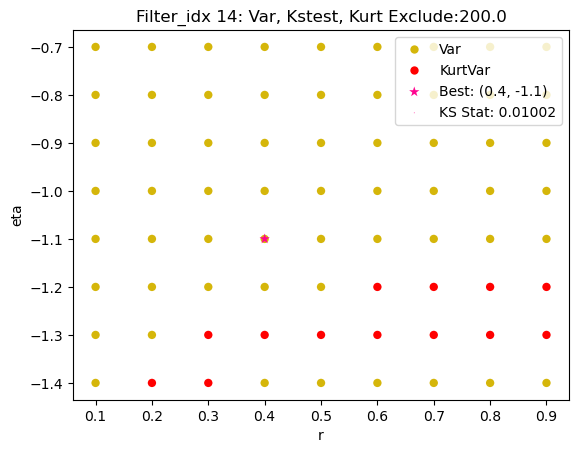

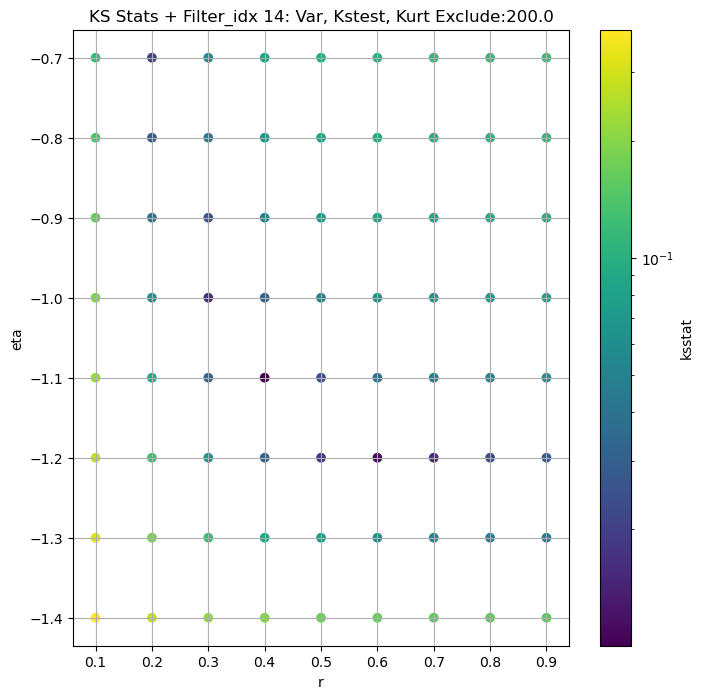

####
Filter_idx  15


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.008224429002447353 97.09839548848727


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.007543103983597033 90.98372746041895


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.0068544403222243755 87.38766079288048


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.007508575498506698 82.02238730383537
Number of samples: 100000, Without approximation : 196608000.0


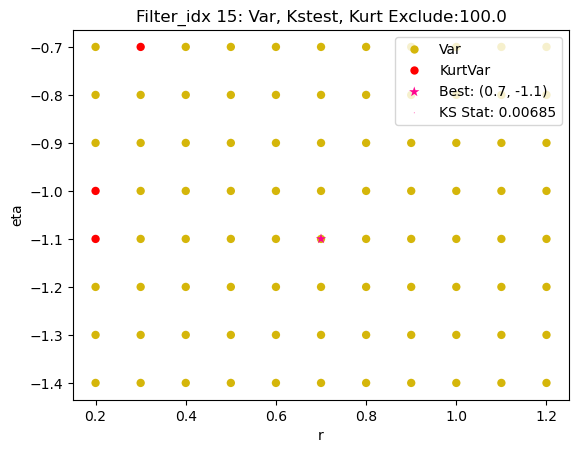

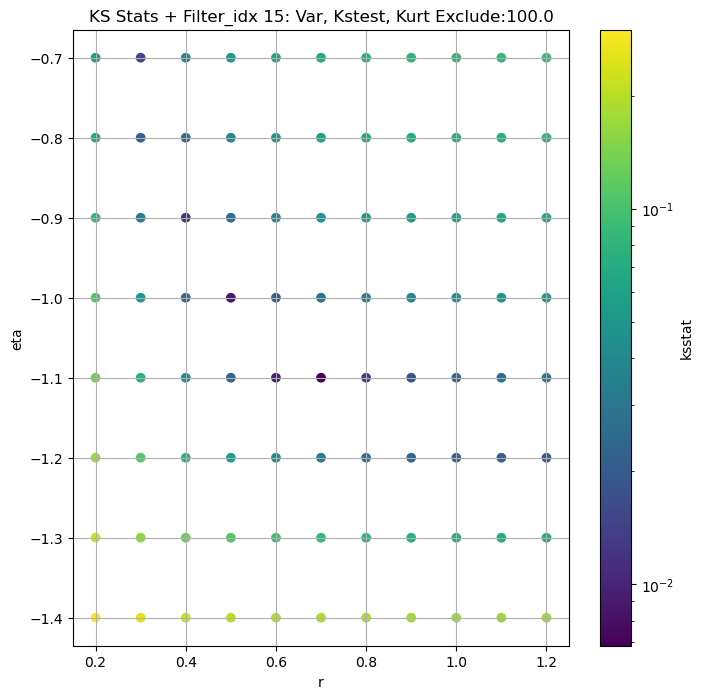

####
Filter_idx  16


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.008777165027689882 24.47623001592762


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.008294480350256483 22.537691613062545


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.008650267954327134 21.496667586512984


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.01020247822723215 19.966212933559483
Number of samples: 100000, Without approximation : 196608000.0


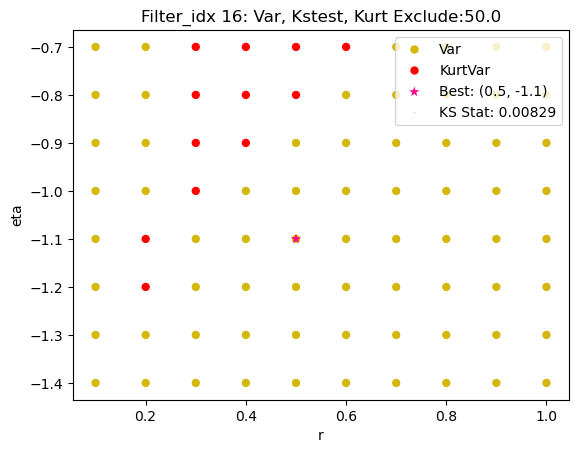

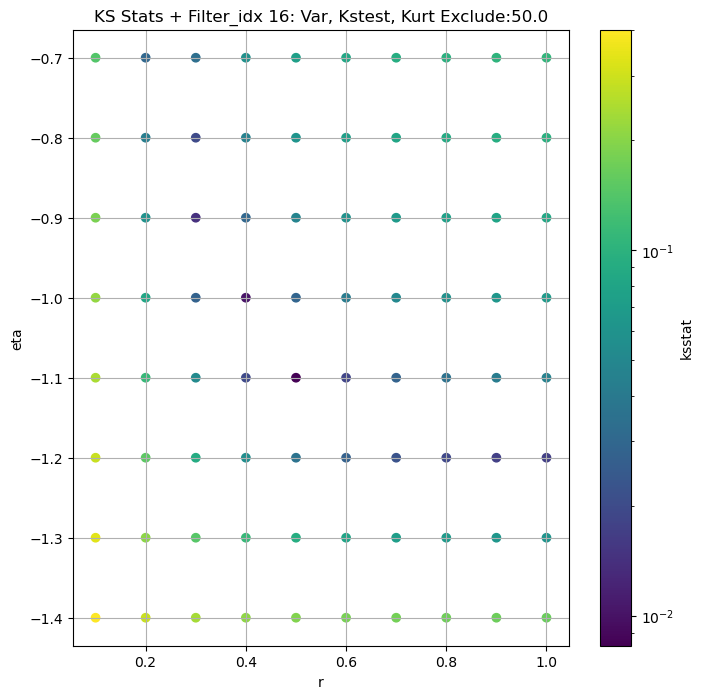

####
Filter_idx  17


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.00980193455598688 6.1843237538997595


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.012936284001713094 5.651856987457724


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.010318278766654476 5.353390514789945


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.009973423944550586 4.9169871722832355
Number of samples: 100000, Without approximation : 196608000.0


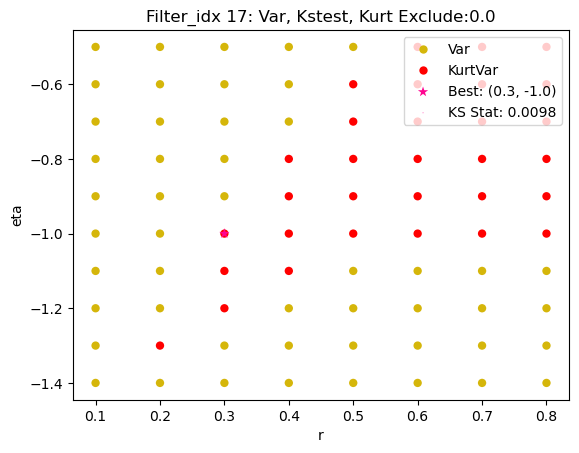

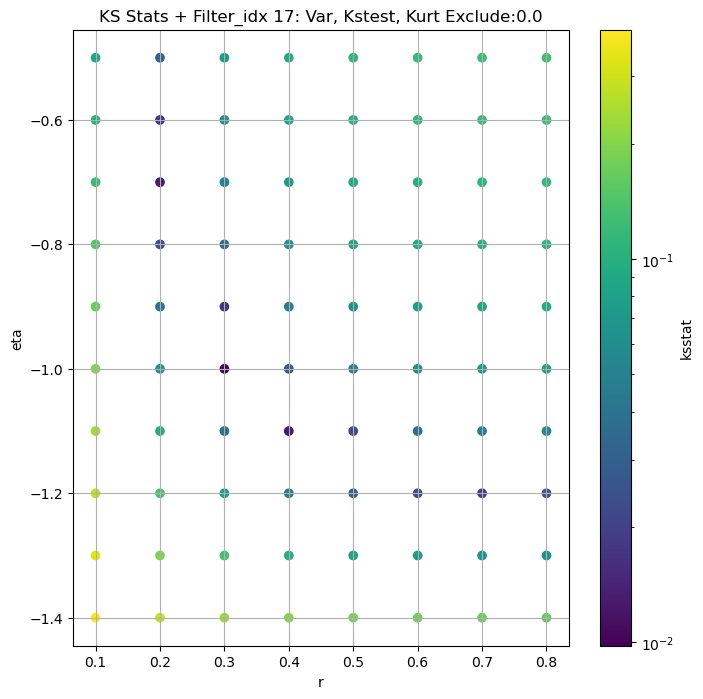

####
Filter_idx  18


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.004994495351696271 1.6109129735066905


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.008045678630078379 1.4578947750368645


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.010188806696518393 1.3734194285633925


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.009470210516654087 1.2502681127471054
Number of samples: 100000, Without approximation : 196608000.0


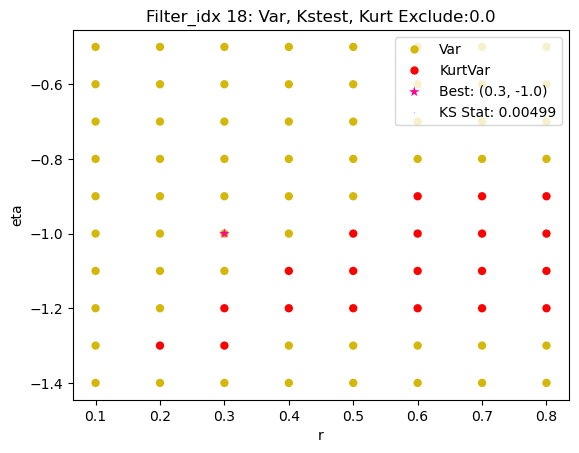

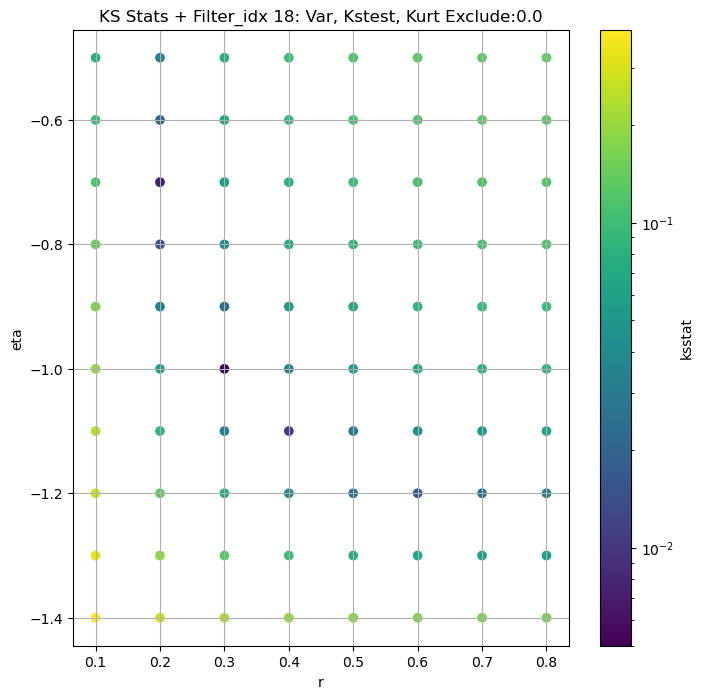

####
Filter_idx  19


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.010939718840166868 0.4868304467401857


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.011431104226065303 0.4341820899064082


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.008917386617288803 0.40638672297560685


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.006806386586176633 0.3667447648567134
Number of samples: 100000, Without approximation : 196608000.0


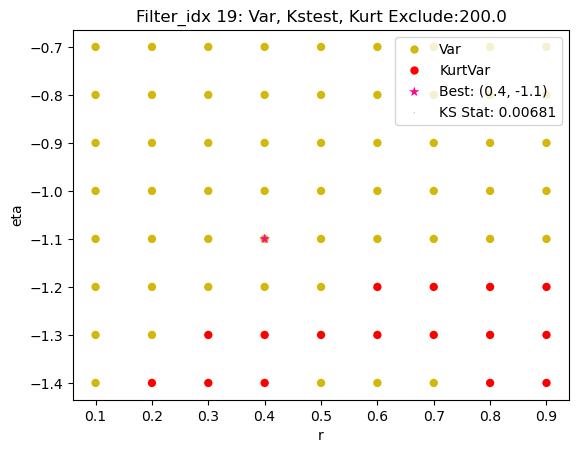

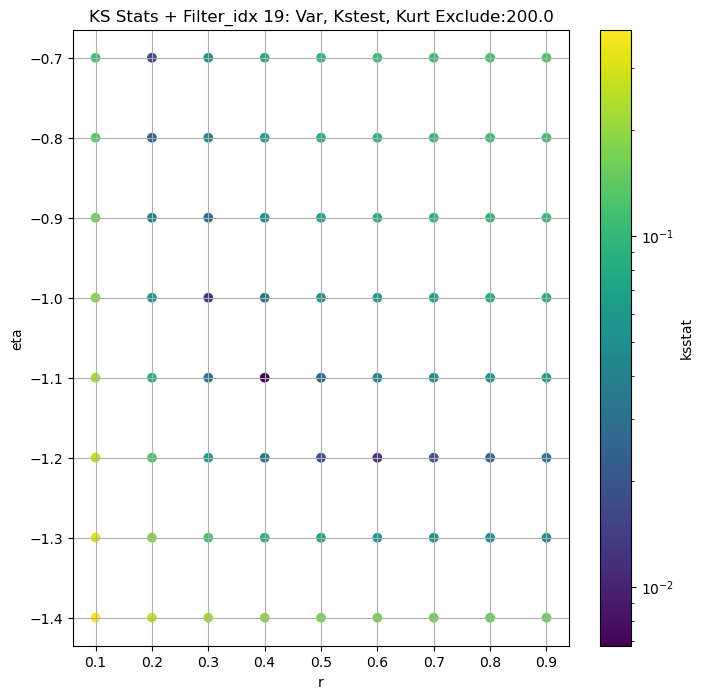

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,
0,63.548928,48.379970,80.931687,7.165057,3.826848,16.333108,196608000.0,"(2.0, 0.5, 0.001)",0.006296,0.7,-1.1,99.046154,0.0,63.548928,0.000097
1,16.307660,12.305715,21.730621,9.287096,4.682542,24.351610,196608000.0,"(2.0, 0.5, 0.002)",0.007764,0.6,-1.1,18.546754,0.0,16.307660,0.000097
2,4.202337,3.154458,5.660183,11.389939,5.542621,32.844753,196608000.0,"(2.0, 0.5, 0.003)",0.008365,0.4,-1.0,0.861184,0.0,4.202337,0.000097
3,1.123752,0.816141,1.521846,13.253161,6.340989,35.143394,196608000.0,"(2.0, 0.5, 0.004)",0.009970,0.5,-1.1,0.728192,50.0,1.048596,0.000097
4,0.309677,0.218014,0.412613,14.076481,7.350612,39.435435,196608000.0,"(2.0, 0.5, 0.005)",0.012722,0.4,-1.1,0.093182,0.0,0.309677,0.000097
5,96.367710,74.343195,121.855985,7.973325,3.719243,21.967798,196608000.0,"(2.0, 0.5, 0.009)",0.004501,0.6,-1.0,81.829020,0.0,96.367710,0.000097
6,24.910594,18.300485,33.594873,10.619910,5.240451,35.423319,196608000.0,"(2.0, 0.5, 0.014)",0.006415,0.7,-1.1,35.102629,100.0,22.522171,0.000097
7,6.427431,4.737144,8.874136,13.242025,6.263086,43.162268,196608000.0,"(2.0, 0.5, 0.022)",0.006669,0.4,-1.0,1.317173,0.0,6.427431,0.000097
8,1.678274,1.163611,2.391877,15.821607,6.910286,52.082524,196608000.0,"(2.0, 0.5, 0.034)",0.008010,0.4,-1.0,0.317785,50.0,1.550704,0.000097


In [22]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()} ", group)
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [23]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 0, 0.0 + 100 = 100, ksstat: 0.006697395679418072, var: 58.73932196637054


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 0, 0.0 + 75 = 75, ksstat: 0.00651910670587541, var: 59.63010849676494


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 0, 0.0 + 50 = 50, ksstat: 0.00610672408564894, var: 60.63502839929674


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 0, 0.0 + 25 = 25, ksstat: 0.005600184841318967, var: 61.823669209951376


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 0, 0.0 + 0 = 0, ksstat: 0.005498555276248207, var: 63.54892825500126
Number of samples: 100000, Without approximation : 196608000.0


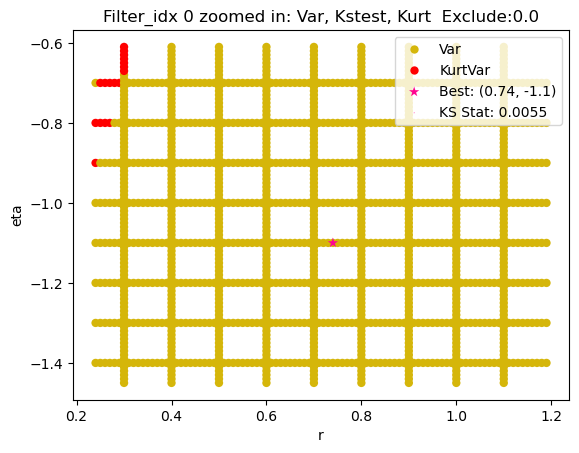

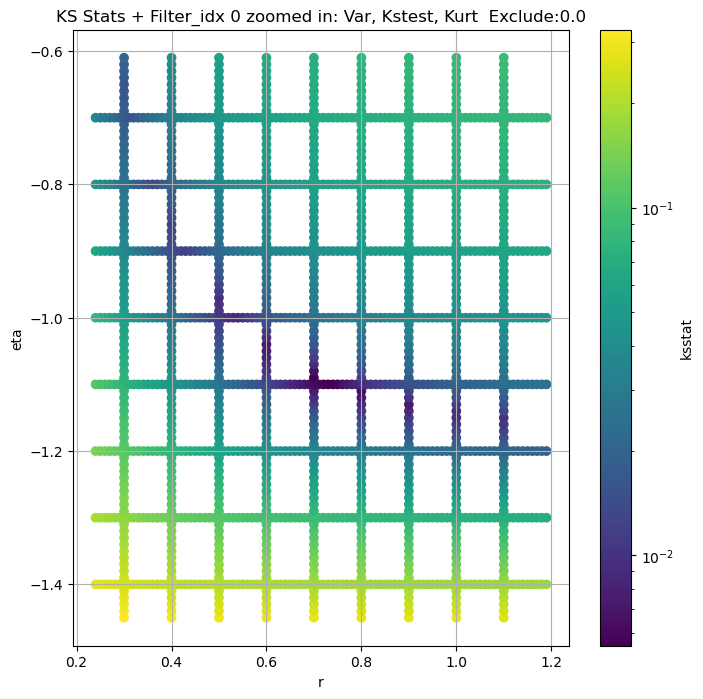

Filter_idx 1


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 1, 0.0 + 100 = 100, ksstat: 0.007233875492490327, var: 14.884828841982044


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 1, 0.0 + 75 = 75, ksstat: 0.007101492059447878, var: 15.14080639405444


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 1, 0.0 + 50 = 50, ksstat: 0.007169486683160142, var: 15.429657364670868


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 1, 0.0 + 25 = 25, ksstat: 0.007232658264995306, var: 15.775302055862722


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 1, 0.0 + 0 = 0, ksstat: 0.007356660090477751, var: 16.307660101522654
Number of samples: 100000, Without approximation : 196608000.0


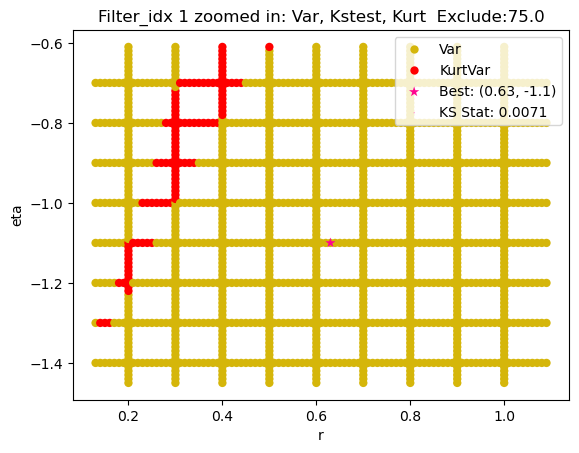

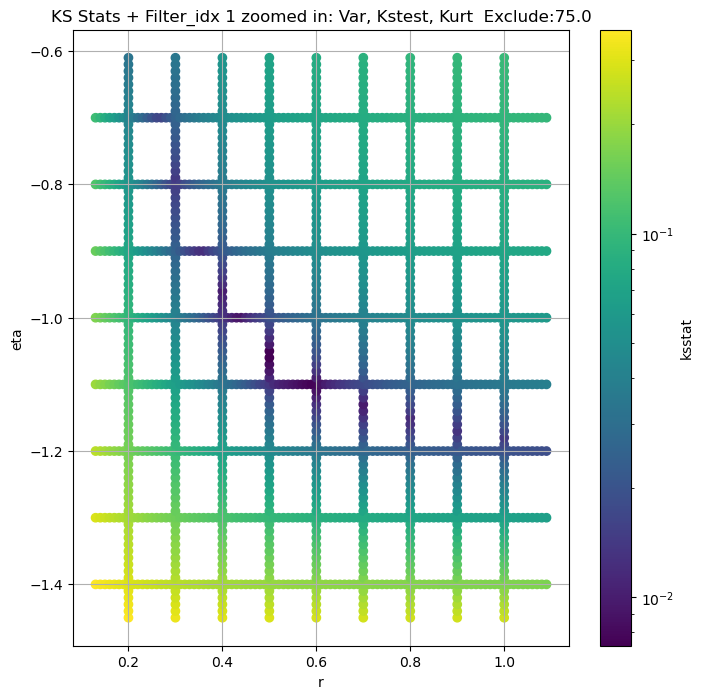

Filter_idx 2


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 2, 0.0 + 100 = 100, ksstat: 0.0075884755406465665, var: 3.7894142220592717


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 2, 0.0 + 75 = 75, ksstat: 0.00788451876008589, var: 3.8635881584516008


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 2, 0.0 + 50 = 50, ksstat: 0.007541725498436236, var: 3.9475090817694185


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 2, 0.0 + 25 = 25, ksstat: 0.008100701304905478, var: 4.047731681283438


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 2, 0.0 + 0 = 0, ksstat: 0.007364999148916029, var: 4.202337210840184
Number of samples: 100000, Without approximation : 196608000.0


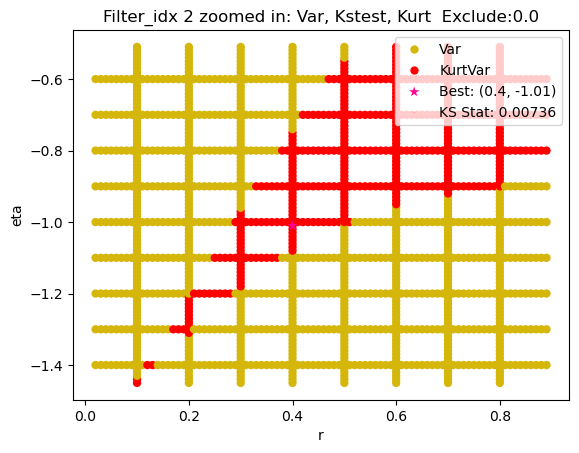

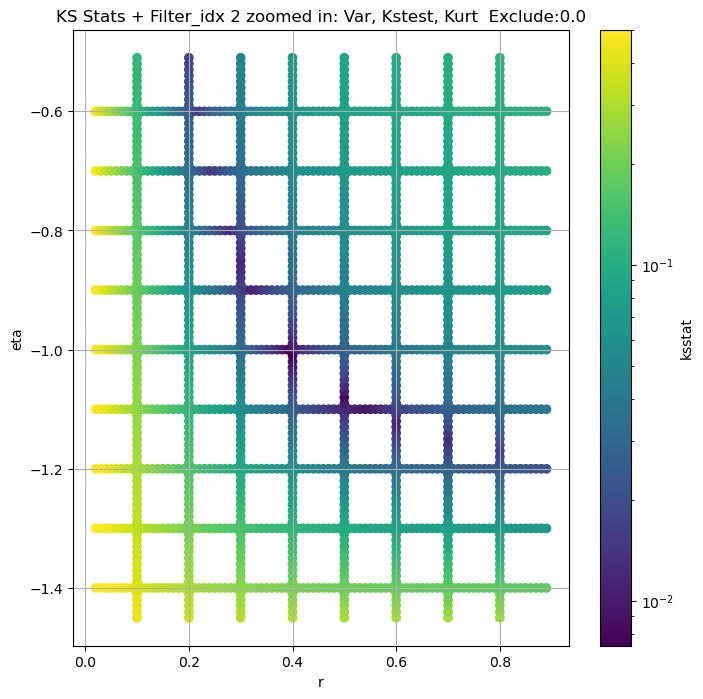

Filter_idx 3


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + 100 = 150, ksstat: 0.009969823898464236, var: 0.9659908791152747


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + 75 = 125, ksstat: 0.009969825500069307, var: 0.9838044776183726


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + 50 = 100, ksstat: 0.009969818684845477, var: 1.0031215570972725


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + 25 = 75, ksstat: 0.00996982057968121, var: 1.0244211228004865


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + 0 = 50, ksstat: 0.009969818037295464, var: 1.0485963364861686


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + -25 = 25, ksstat: 0.009969820512241157, var: 1.077713773236107


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 3, 50.0 + -50 = 0, ksstat: 0.0099698194205039, var: 1.1237520334032551
Number of samples: 100000, Without approximation : 196608000.0


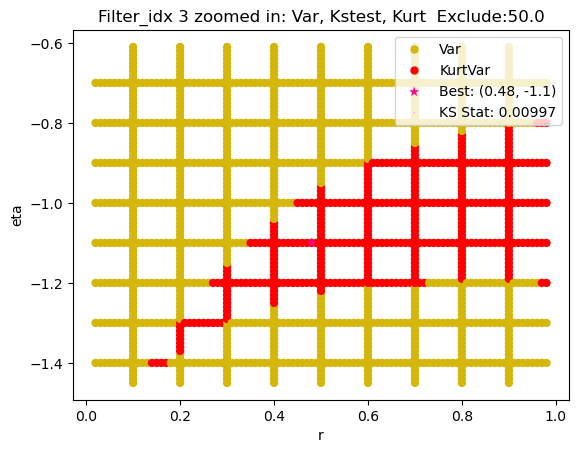

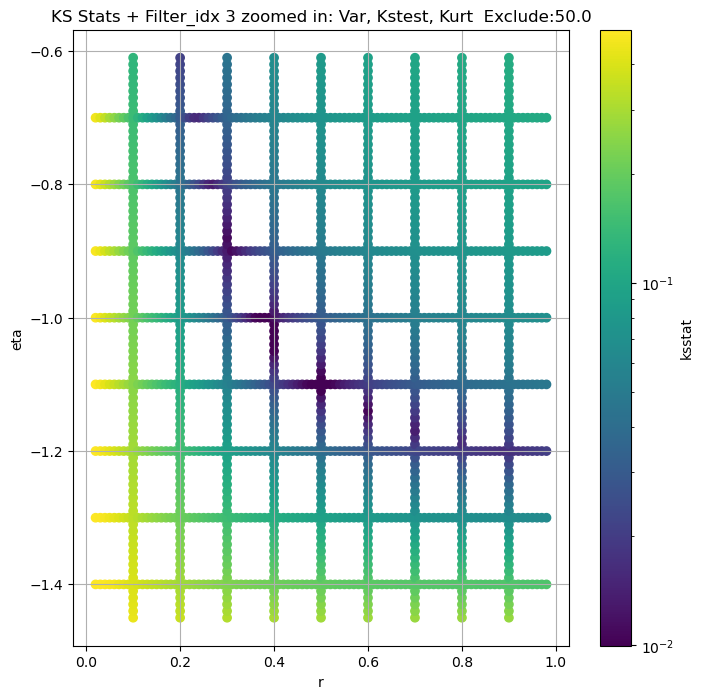

Filter_idx 4


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 4, 0.0 + 100 = 100, ksstat: 0.012719999999983855, var: 0.2750614728896792


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 4, 0.0 + 75 = 75, ksstat: 0.012719999999983855, var: 0.2812226800746218


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 4, 0.0 + 50 = 50, ksstat: 0.012719999999983855, var: 0.28822041316088964


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 4, 0.0 + 25 = 25, ksstat: 0.01271999999998974, var: 0.2966316631844199


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 4, 0.0 + 0 = 0, ksstat: 0.012719999999989073, var: 0.3096766359264535
Number of samples: 100000, Without approximation : 196608000.0


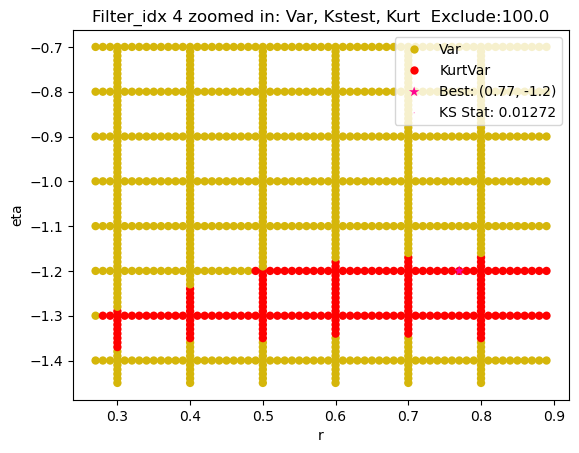

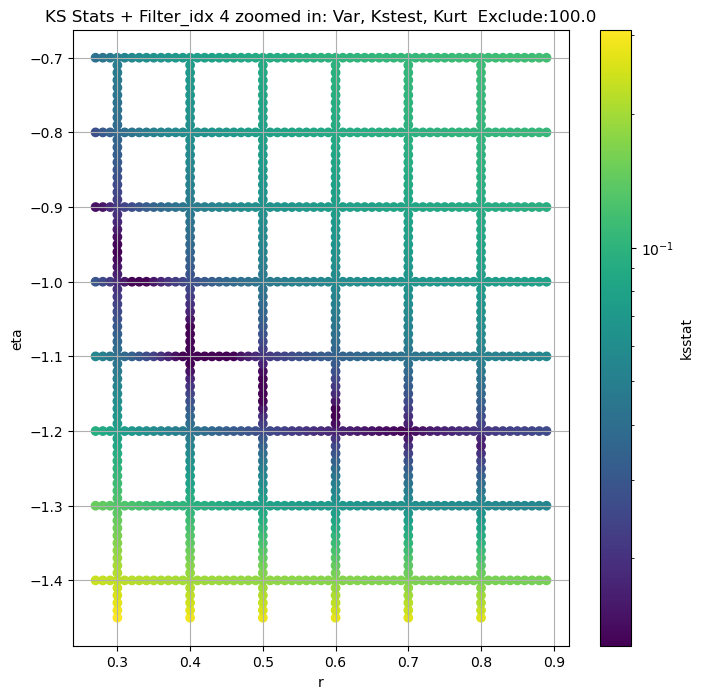

Filter_idx 5


  0%|          | 0/1665 [00:00<?, ?it/s]

Finding Minimum after computing 1665 CDFs
filter_idx 5, 0.0 + 100 = 100, ksstat: 0.005599566421790603, var: 88.43249010737598


  0%|          | 0/1665 [00:00<?, ?it/s]

Finding Minimum after computing 1665 CDFs
filter_idx 5, 0.0 + 75 = 75, ksstat: 0.005066904628880042, var: 89.85868154965522


  0%|          | 0/1665 [00:00<?, ?it/s]

Finding Minimum after computing 1665 CDFs
filter_idx 5, 0.0 + 50 = 50, ksstat: 0.0048612762046895686, var: 91.4748407264935


  0%|          | 0/1665 [00:00<?, ?it/s]

Finding Minimum after computing 1665 CDFs
filter_idx 5, 0.0 + 25 = 25, ksstat: 0.00436672713578834, var: 93.41238826374894


  0%|          | 0/1665 [00:00<?, ?it/s]

Finding Minimum after computing 1665 CDFs
filter_idx 5, 0.0 + 0 = 0, ksstat: 0.00435547511209966, var: 96.3677100883937
Number of samples: 100000, Without approximation : 196608000.0


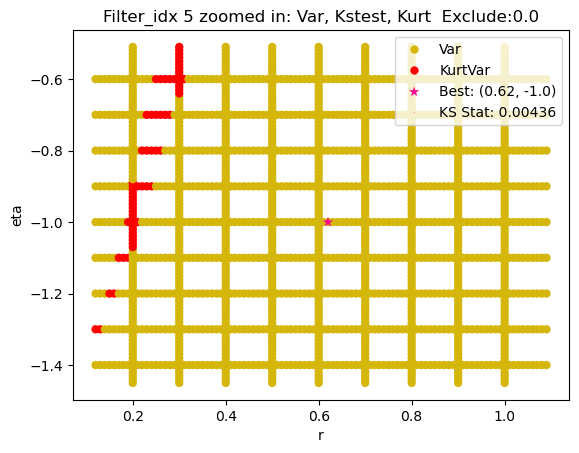

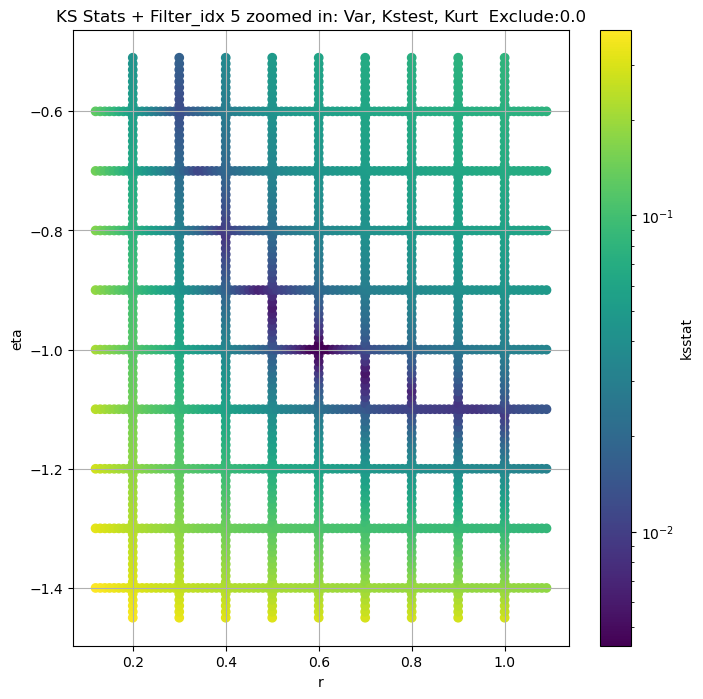

Filter_idx 6


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + 100 = 200, ksstat: 0.006309592073297288, var: 21.16336517556334


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + 75 = 175, ksstat: 0.006080366703617335, var: 21.469341511833914


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + 50 = 150, ksstat: 0.005775941170493404, var: 21.79465430801041


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + 25 = 125, ksstat: 0.006075558811093007, var: 22.143634550415758


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + 0 = 100, ksstat: 0.00560926009399576, var: 22.522171307340262


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + -25 = 75, ksstat: 0.005102620487630993, var: 22.940364464729583


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + -50 = 50, ksstat: 0.004630956919999263, var: 23.4160815315743


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + -75 = 25, ksstat: 0.005126603109877767, var: 23.989559393926353


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 6, 100.0 + -100 = 0, ksstat: 0.003774773826781916, var: 24.910593631133633
Number of samples: 100000, Without approximation : 196608000.0


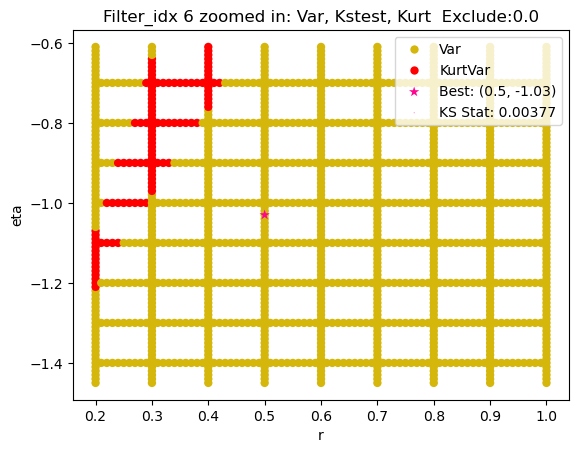

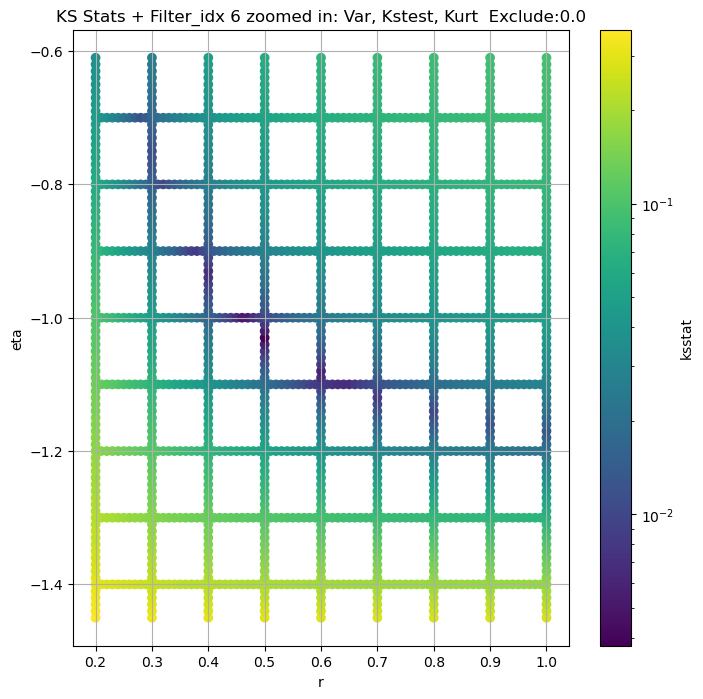

Filter_idx 7


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 7, 0.0 + 100 = 100, ksstat: 0.0065776014460213195, var: 5.726934266392751


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 7, 0.0 + 75 = 75, ksstat: 0.006298898249060936, var: 5.849491026949677


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 7, 0.0 + 50 = 50, ksstat: 0.0067057490809897535, var: 5.989455179991189


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 7, 0.0 + 25 = 25, ksstat: 0.006562975602653176, var: 6.158407559881174


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 7, 0.0 + 0 = 0, ksstat: 0.006350587324102541, var: 6.427431168576379
Number of samples: 100000, Without approximation : 196608000.0


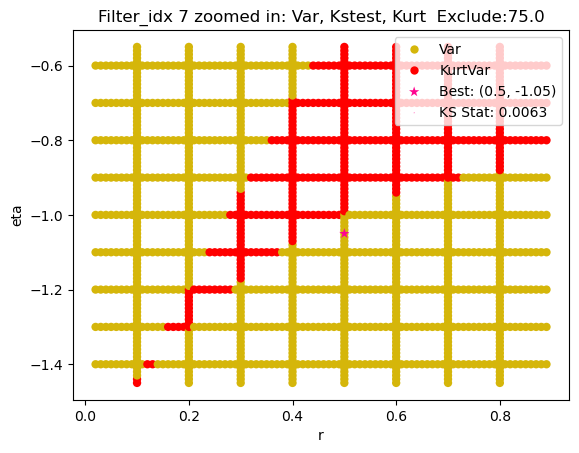

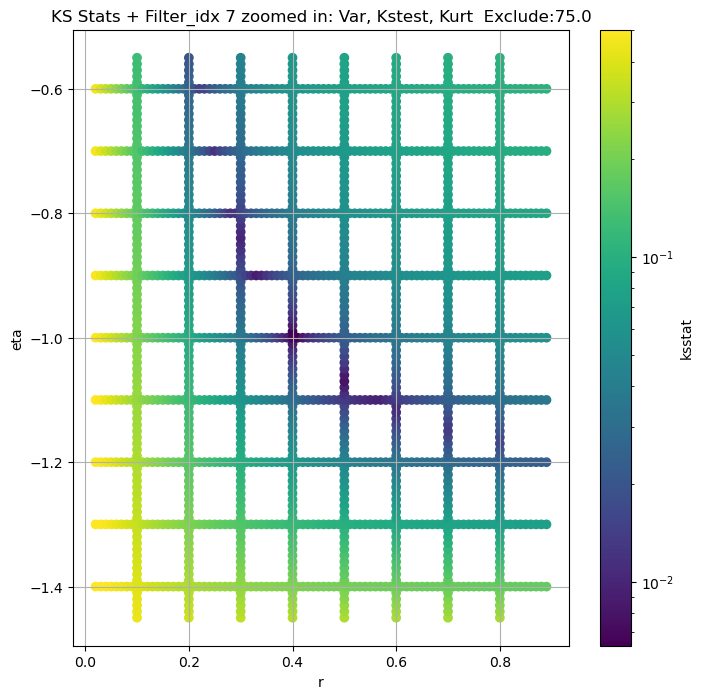

Filter_idx 8


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + 100 = 150, ksstat: 0.008009999999993522, var: 1.415801460613895


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + 75 = 125, ksstat: 0.008009999999990636, var: 1.4446622128319626


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + 50 = 100, ksstat: 0.008009999999990747, var: 1.4761070816318553


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + 25 = 75, ksstat: 0.008009999999993411, var: 1.5109676046138576


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + 0 = 50, ksstat: 0.008009999999993633, var: 1.5507035570288983


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + -25 = 25, ksstat: 0.008009999999992856, var: 1.5988676857265192


  0%|          | 0/1480 [00:00<?, ?it/s]

Finding Minimum after computing 1480 CDFs
filter_idx 8, 50.0 + -50 = 0, ksstat: 0.008009999999993744, var: 1.6782738892039424
Number of samples: 100000, Without approximation : 196608000.0


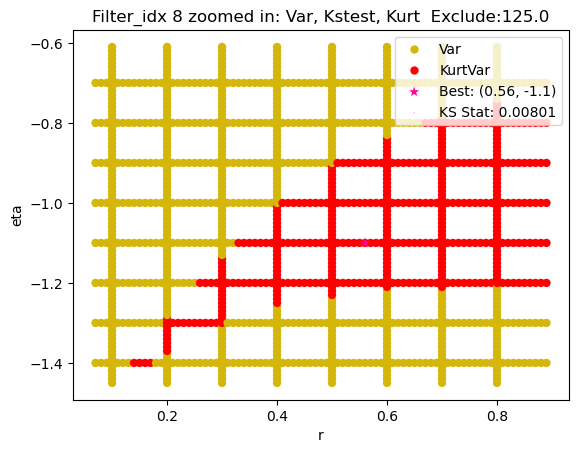

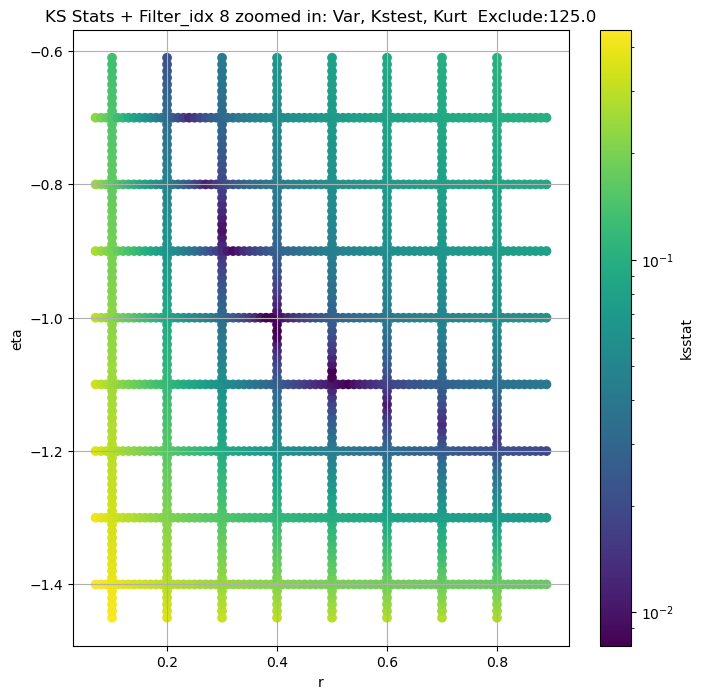

Filter_idx 9


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + 100 = 300, ksstat: 0.010048787291492167, var: 0.34714606765069816


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + 75 = 275, ksstat: 0.010048797395204256, var: 0.35300368277914973


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + 50 = 250, ksstat: 0.010048807755900335, var: 0.3591656009838793


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + 25 = 225, ksstat: 0.010048760268461798, var: 0.3656724648677318


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + 0 = 200, ksstat: 0.010048771798609968, var: 0.3725704354609116


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + -25 = 175, ksstat: 0.01004875203542488, var: 0.37992193917467676


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + -50 = 150, ksstat: 0.010048731014566603, var: 0.3878107791062728


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + -75 = 125, ksstat: 0.010048744750584482, var: 0.39634473596796216


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 9, 200.0 + -100 = 100, ksstat: 0.010048723666424286, var: 0.4056921176360565
Number of samples: 100000, Without approximation : 196608000.0


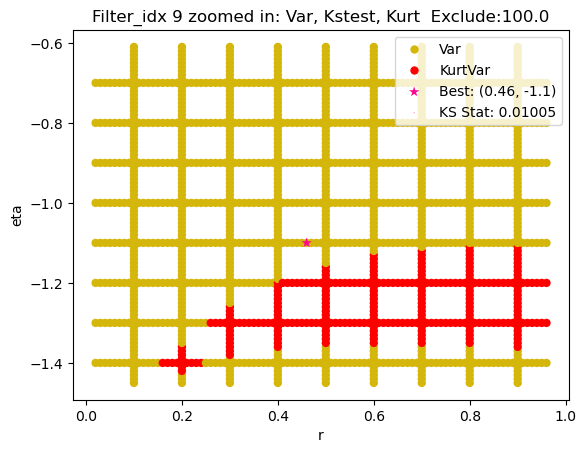

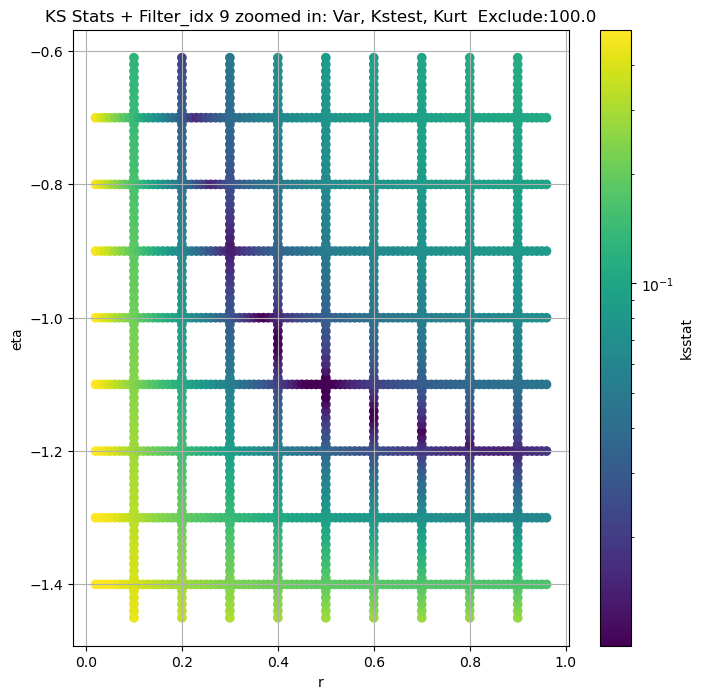

Filter_idx 10


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 0.0 + 100 = 100, ksstat: 0.007526791619658857, var: 63.088566948295394


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 0.0 + 75 = 75, ksstat: 0.006776329920002211, var: 64.20090972649452


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 0.0 + 50 = 50, ksstat: 0.007215180952399813, var: 65.47044064444354


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 0.0 + 25 = 25, ksstat: 0.006946149846501548, var: 67.00413956185155


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 0.0 + 0 = 0, ksstat: 0.006199282807544337, var: 69.3721851998416
Number of samples: 100000, Without approximation : 196608000.0


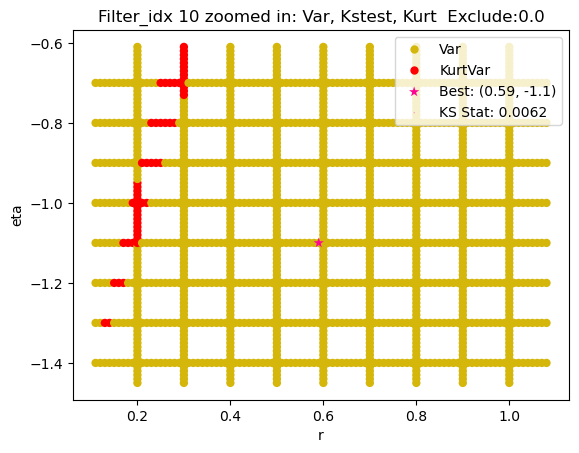

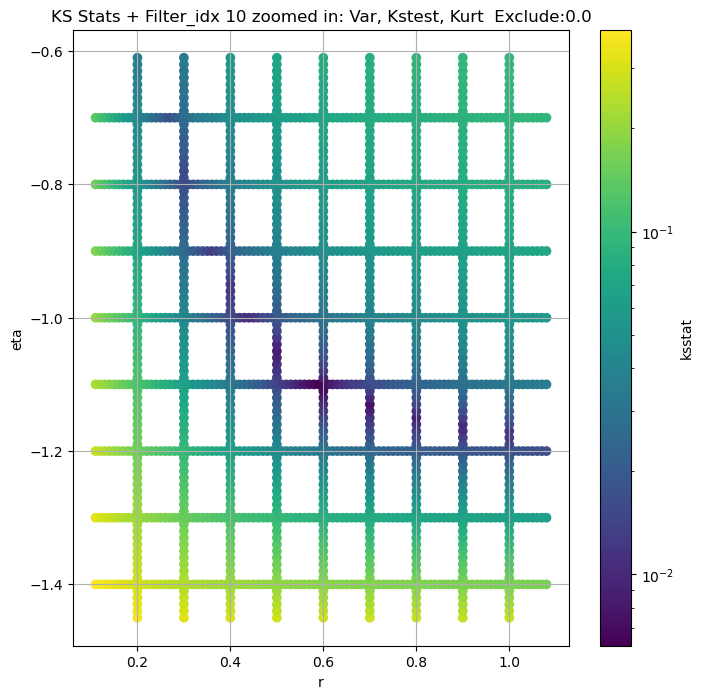

Filter_idx 11


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + 100 = 150, ksstat: 0.008525145990548079, var: 15.02774363991797


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + 75 = 125, ksstat: 0.00825435023861329, var: 15.286462618254014


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + 50 = 100, ksstat: 0.007958953755302076, var: 15.569018287014021


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + 25 = 75, ksstat: 0.007620767281621532, var: 15.883401751155551


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + 0 = 50, ksstat: 0.007241129773603139, var: 16.244872192977397


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + -25 = 25, ksstat: 0.007137999357224034, var: 16.68930231863228


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 11, 50.0 + -50 = 0, ksstat: 0.00748126869717991, var: 17.442214413404848
Number of samples: 100000, Without approximation : 196608000.0


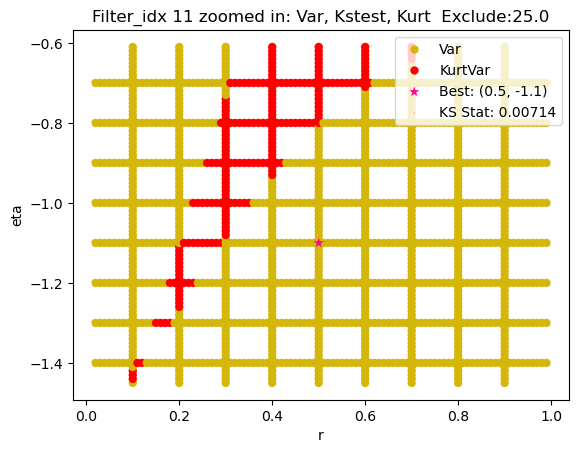

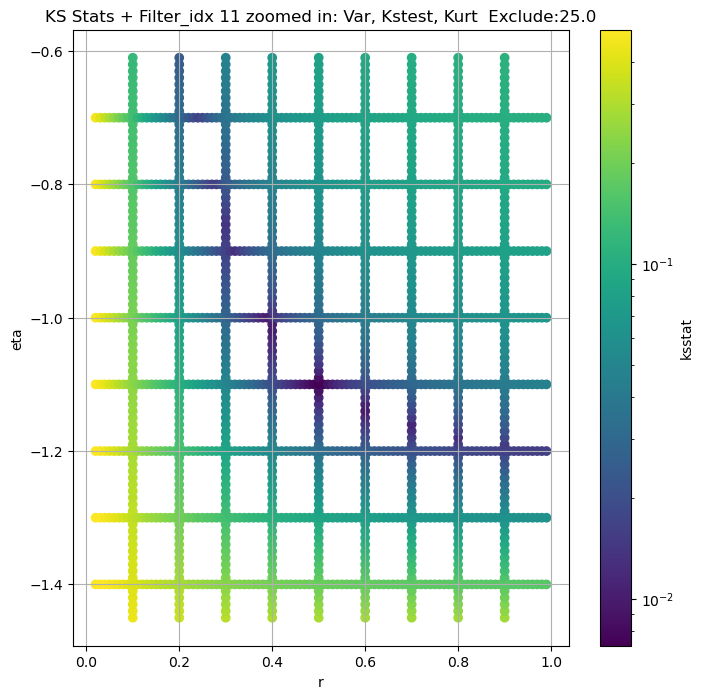

Filter_idx 12


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.009450526395429981, var: 3.380438867942174


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.008945053454335092, var: 3.431666720669151


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.008715974239114993, var: 3.48534603355894


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.008487519102521802, var: 3.5418055048963546


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.008046053832034938, var: 3.6014472107411017


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.0076399748108295015, var: 3.6648236038925033


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.007702824940534259, var: 3.7326239502849683


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.007468981525902807, var: 3.80578356535219


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.007817472791227353, var: 3.88571961435009
Number of samples: 100000, Without approximation : 196608000.0


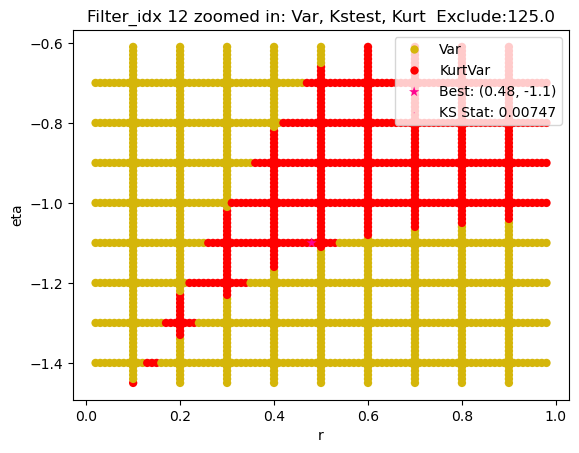

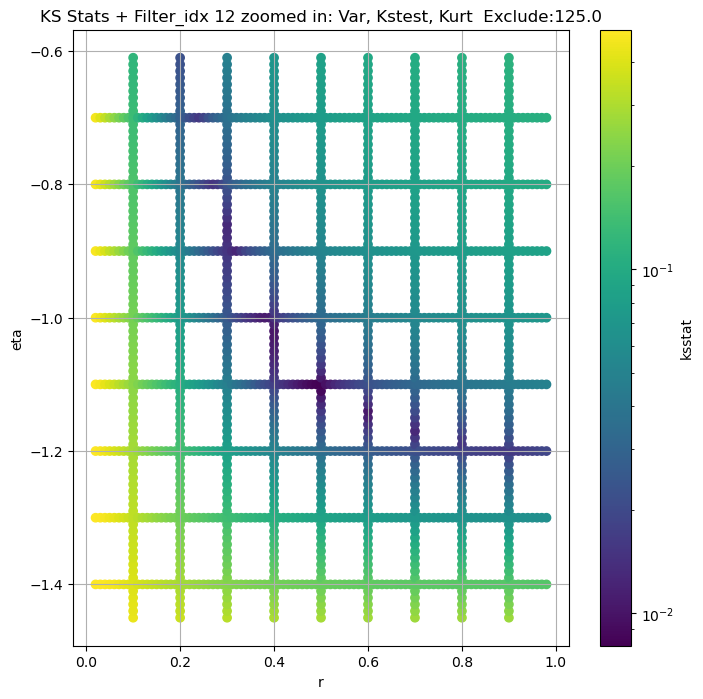

Filter_idx 13


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 13, 0.0 + 100 = 100, ksstat: 0.005623748835067555, var: 1.0210027729816027


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 13, 0.0 + 75 = 75, ksstat: 0.005780934794842159, var: 1.046228503919032


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 13, 0.0 + 50 = 50, ksstat: 0.005191591846703751, var: 1.0752269392406717


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 13, 0.0 + 25 = 25, ksstat: 0.006075339884779929, var: 1.1108904426407298


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 13, 0.0 + 0 = 0, ksstat: 0.005299777408017584, var: 1.170050214515642
Number of samples: 100000, Without approximation : 196608000.0


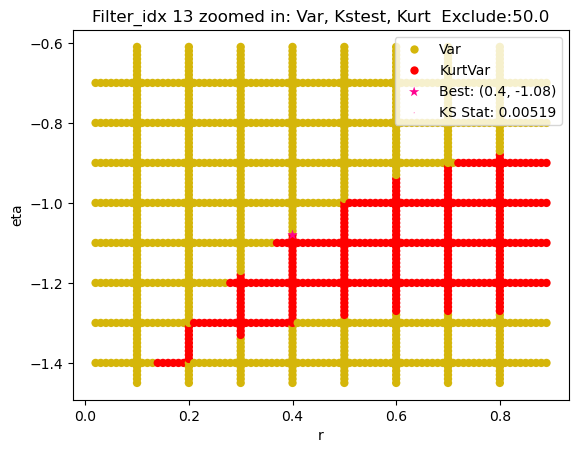

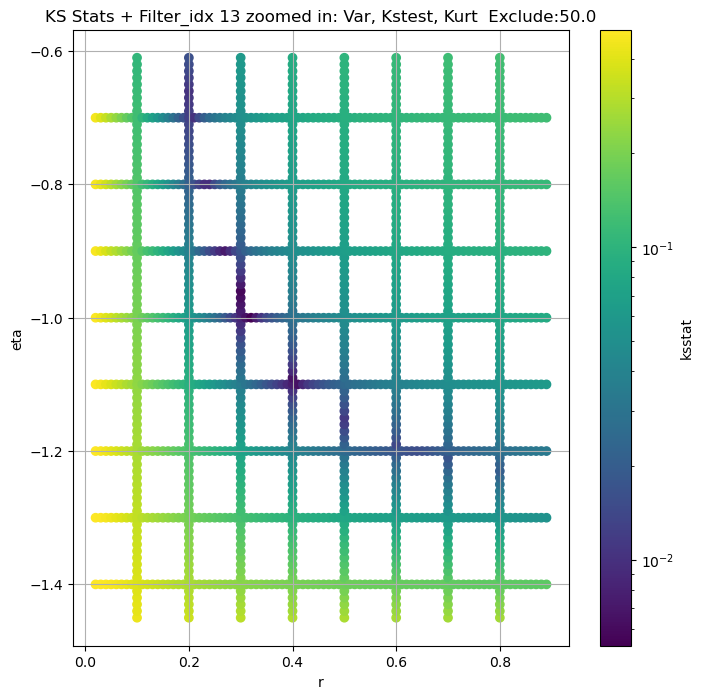

Filter_idx 14


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + 100 = 300, ksstat: 0.00879049363571327, var: 0.26922413862520717


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + 75 = 275, ksstat: 0.00852880629771574, var: 0.27391598764996516


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + 50 = 250, ksstat: 0.007934500138998143, var: 0.27885040368639025


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + 25 = 225, ksstat: 0.0076751085943452535, var: 0.2840584055237389


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + 0 = 200, ksstat: 0.007074666528858131, var: 0.28957888239418006


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + -25 = 175, ksstat: 0.007100616862645848, var: 0.29546514636612975


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + -50 = 150, ksstat: 0.00729442636780081, var: 0.3017849506181699


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + -75 = 125, ksstat: 0.006951780435222155, var: 0.30863187475786286


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 14, 200.0 + -100 = 100, ksstat: 0.006948129171156503, var: 0.3161439464410394
Number of samples: 100000, Without approximation : 196608000.0


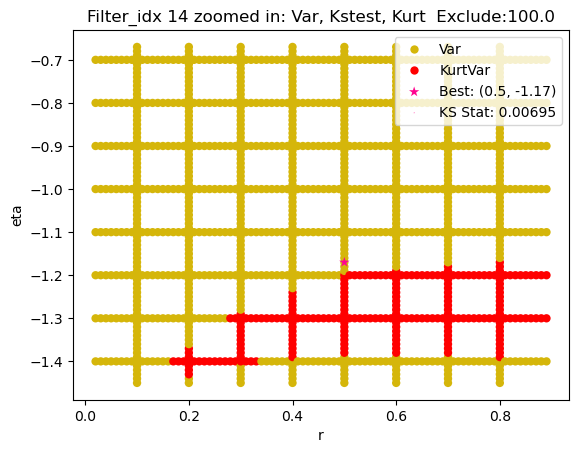

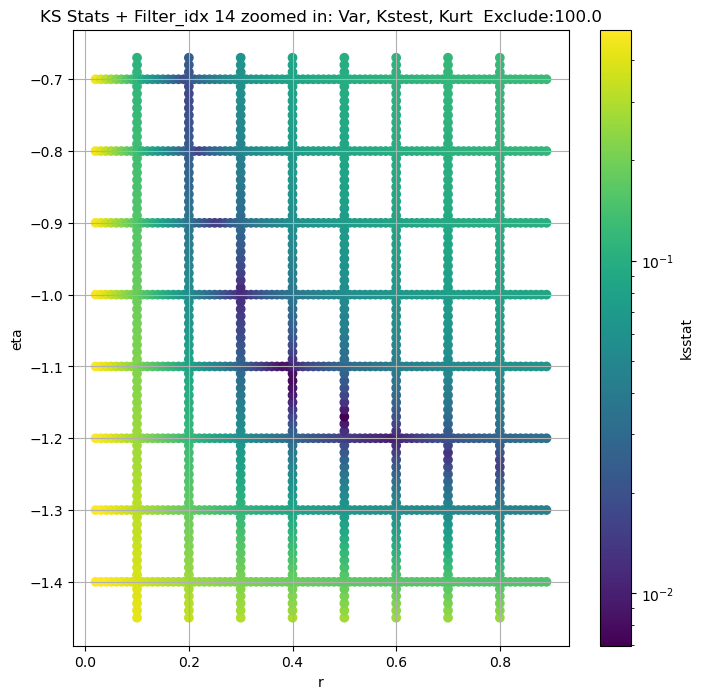

Filter_idx 15


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + 100 = 200, ksstat: 0.006560269150023834, var: 82.02238730383537


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + 75 = 175, ksstat: 0.006528306477978085, var: 83.22145058194867


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + 50 = 150, ksstat: 0.006510398104376147, var: 84.50214718192855


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + 25 = 125, ksstat: 0.006650358770264986, var: 85.88224402413987


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + 0 = 100, ksstat: 0.006459682129085764, var: 87.38766079288048


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + -25 = 75, ksstat: 0.0056901567593274915, var: 89.06111535657334


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + -50 = 50, ksstat: 0.0058814430718271415, var: 90.98372746041895


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + -75 = 25, ksstat: 0.006075653713501161, var: 93.33918087539239


  0%|          | 0/1570 [00:00<?, ?it/s]

Finding Minimum after computing 1570 CDFs
filter_idx 15, 100.0 + -100 = 0, ksstat: 0.005394748793898341, var: 97.09839548848727
Number of samples: 100000, Without approximation : 196608000.0


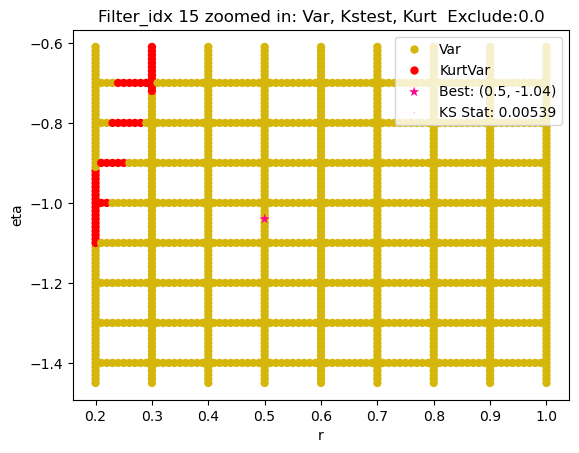

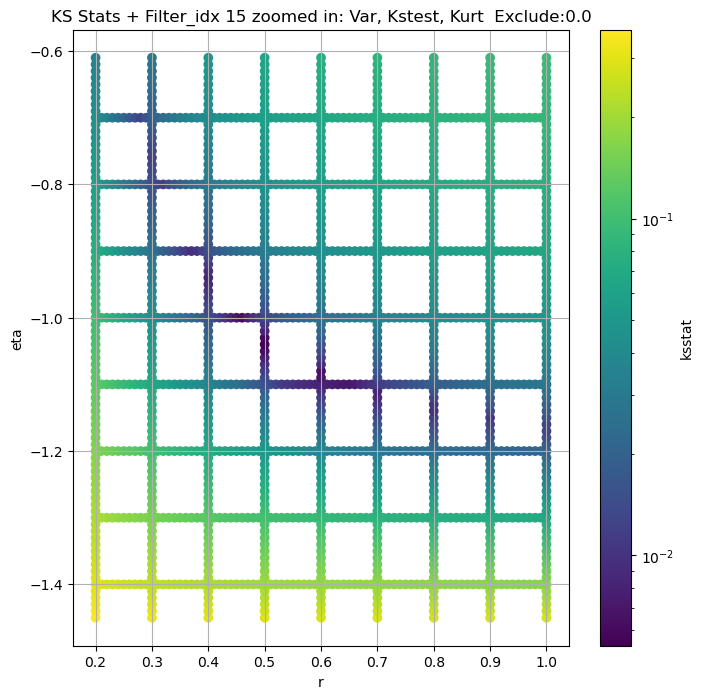

Filter_idx 16


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + 100 = 150, ksstat: 0.007425183658856027, var: 20.670594733459016


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + 75 = 125, ksstat: 0.006729737639679767, var: 21.064761626178832


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + 50 = 100, ksstat: 0.007312026153920792, var: 21.496667586512984


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + 25 = 75, ksstat: 0.007055851502670185, var: 21.979285904753077


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + 0 = 50, ksstat: 0.007192420026419399, var: 22.537691613062545


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + -25 = 25, ksstat: 0.006837106581488853, var: 23.230761019773862


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 16, 50.0 + -50 = 0, ksstat: 0.005218325589655626, var: 24.47623001592762
Number of samples: 100000, Without approximation : 196608000.0


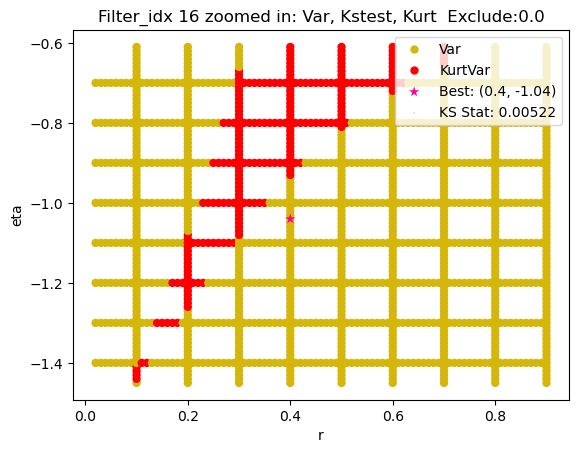

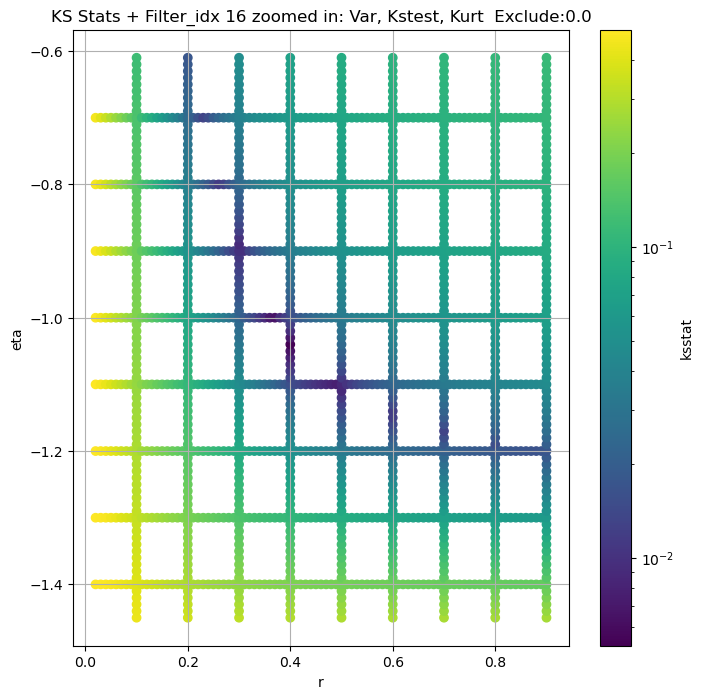

Filter_idx 17


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.0072125422049208465, var: 5.353390514789945


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.006807547599560149, var: 5.491864486639002


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.006110955975247349, var: 5.651856987457724


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.005781836496215206, var: 5.849022614591211


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.005200063436175725, var: 6.1843237538997595
Number of samples: 100000, Without approximation : 196608000.0


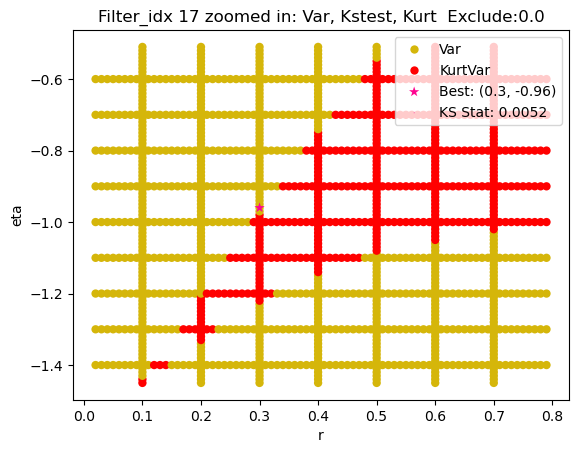

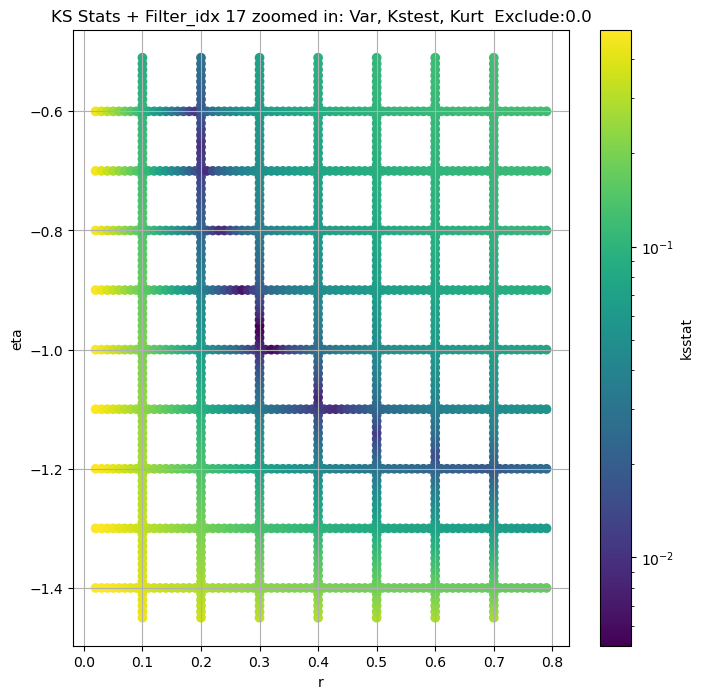

Filter_idx 18


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 18, 0.0 + 100 = 100, ksstat: 0.005918682411553494, var: 1.3734194285633925


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 18, 0.0 + 75 = 75, ksstat: 0.005842035039690913, var: 1.4126072042881777


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 18, 0.0 + 50 = 50, ksstat: 0.004724963304174497, var: 1.4578947750368645


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 18, 0.0 + 25 = 25, ksstat: 0.004379168183226624, var: 1.5137948554521934


  0%|          | 0/1304 [00:00<?, ?it/s]

Finding Minimum after computing 1304 CDFs
filter_idx 18, 0.0 + 0 = 0, ksstat: 0.004490755917378464, var: 1.6109129735066905
Number of samples: 100000, Without approximation : 196608000.0


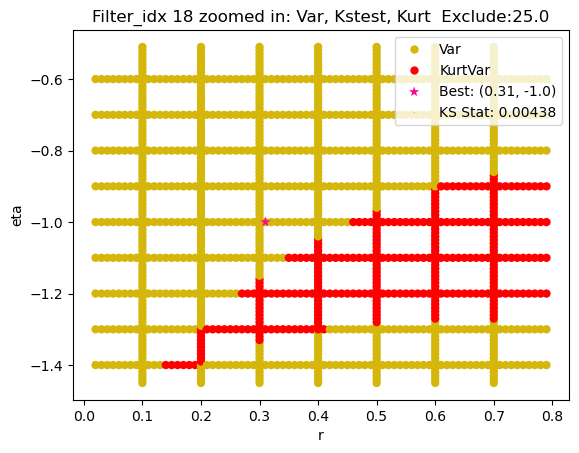

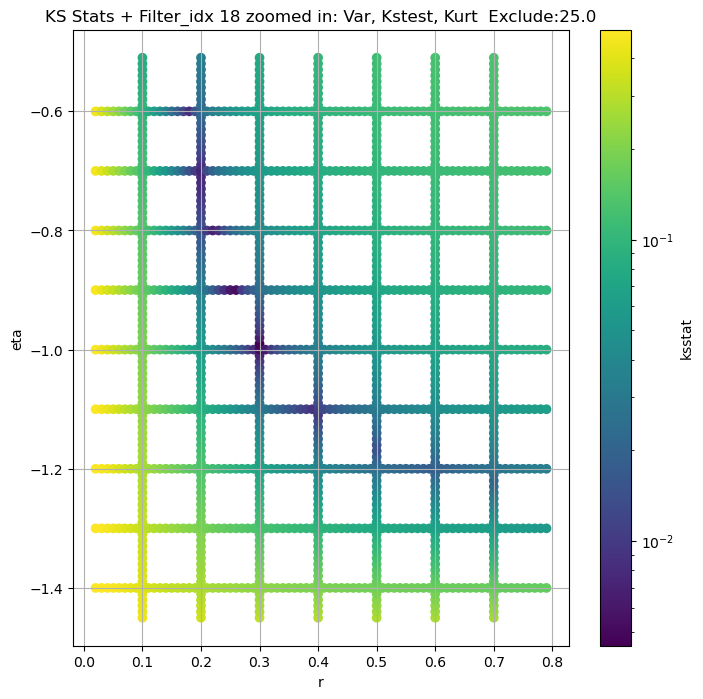

Filter_idx 19


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + 100 = 300, ksstat: 0.006956778690891764, var: 0.33726493357736426


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + 75 = 275, ksstat: 0.007408120972557497, var: 0.3439938713522572


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + 50 = 250, ksstat: 0.007061350718202242, var: 0.3511122335255596


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + 25 = 225, ksstat: 0.00670268020222381, var: 0.35867346278917506


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + 0 = 200, ksstat: 0.006806386586176633, var: 0.3667447648567134


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + -25 = 175, ksstat: 0.006414152910151592, var: 0.37541330868013395


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + -50 = 150, ksstat: 0.005606152220496409, var: 0.3847903019341254


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + -75 = 125, ksstat: 0.005130167727465891, var: 0.3950365302813387


  0%|          | 0/1320 [00:00<?, ?it/s]

Finding Minimum after computing 1320 CDFs
filter_idx 19, 200.0 + -100 = 100, ksstat: 0.005087278284659602, var: 0.40638672297560685
Number of samples: 100000, Without approximation : 196608000.0


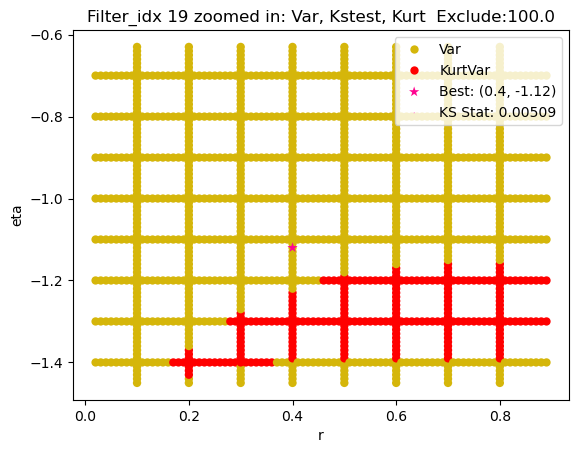

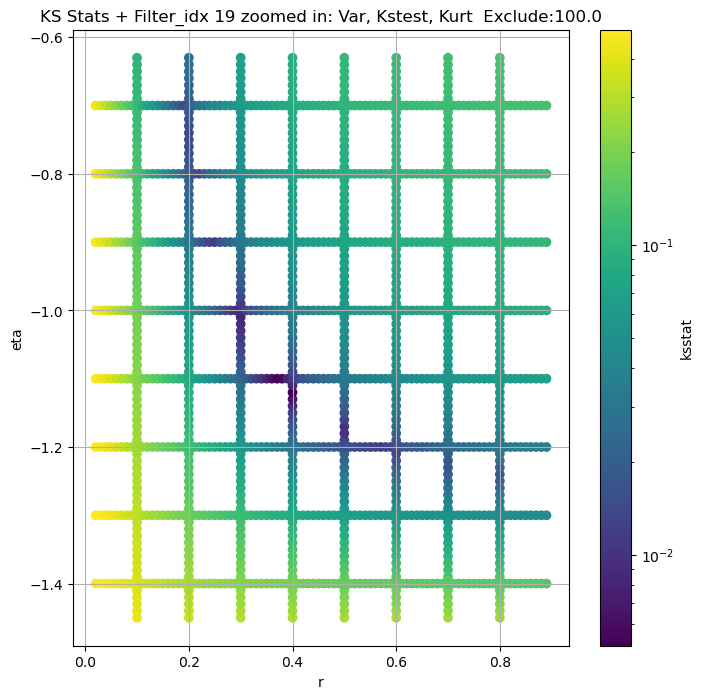

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,63.548928,48.379970,80.931687,7.165057,3.826848,16.333108,196608000.0,"(2.0, 0.5, 0.001)",0.006296,0.7,...,99.046154,0.0,63.548928,0.000097,0.005499,0.74,-1.10,108.886015,0.0,60750
1,16.307660,12.305715,21.730621,9.287096,4.682542,24.351610,196608000.0,"(2.0, 0.5, 0.002)",0.007764,0.6,...,18.546754,0.0,15.140806,0.000097,0.007101,0.63,-1.10,19.197756,75.0,36000
2,4.202337,3.154458,5.660183,11.389939,5.542621,32.844753,196608000.0,"(2.0, 0.5, 0.003)",0.008365,0.4,...,0.861184,0.0,4.202337,0.000097,0.007365,0.40,-1.01,0.892334,0.0,36000
3,1.123752,0.816141,1.521846,13.253161,6.340989,35.143394,196608000.0,"(2.0, 0.5, 0.004)",0.009970,0.5,...,0.728192,50.0,1.048596,0.000097,0.009970,0.48,-1.10,0.638241,50.0,18000
4,0.309677,0.218014,0.412613,14.076481,7.350612,39.435435,196608000.0,"(2.0, 0.5, 0.005)",0.012722,0.4,...,0.093182,0.0,0.275061,0.000097,0.012720,0.77,-1.20,0.691507,100.0,12000
5,96.367710,74.343195,121.855985,7.973325,3.719243,21.967798,196608000.0,"(2.0, 0.5, 0.009)",0.004501,0.6,...,81.829020,0.0,96.367710,0.000097,0.004355,0.62,-1.00,88.629111,0.0,96000
6,24.910594,18.300485,33.594873,10.619910,5.240451,35.423319,196608000.0,"(2.0, 0.5, 0.014)",0.006415,0.7,...,35.102629,100.0,24.910594,0.000097,0.003775,0.50,-1.03,13.660119,0.0,136687
7,6.427431,4.737144,8.874136,13.242025,6.263086,43.162268,196608000.0,"(2.0, 0.5, 0.022)",0.006669,0.4,...,1.317173,0.0,5.849491,0.000097,0.006299,0.50,-1.05,3.420755,75.0,48000
8,1.678274,1.163611,2.391877,15.821607,6.910286,52.082524,196608000.0,"(2.0, 0.5, 0.034)",0.008010,0.4,...,0.317785,50.0,1.444662,0.000097,0.008010,0.56,-1.10,1.386687,125.0,30375


In [24]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group} zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

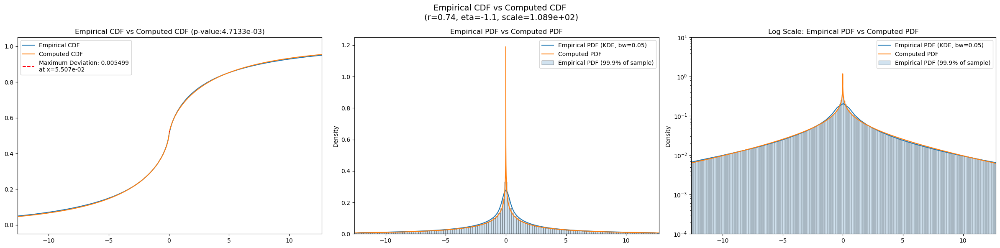

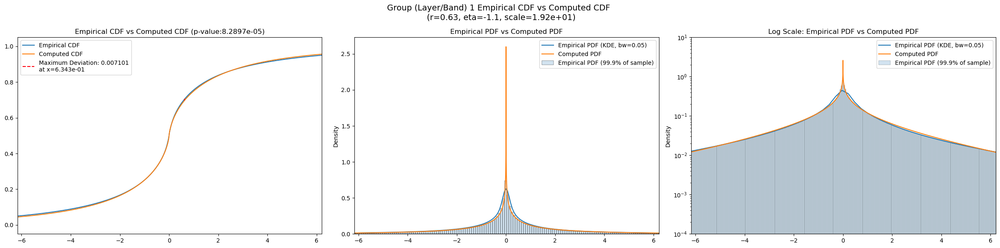

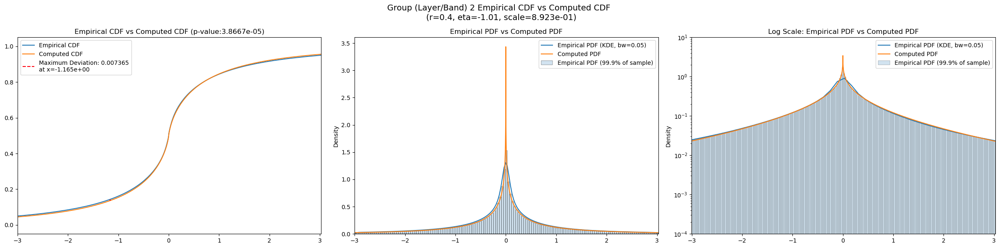

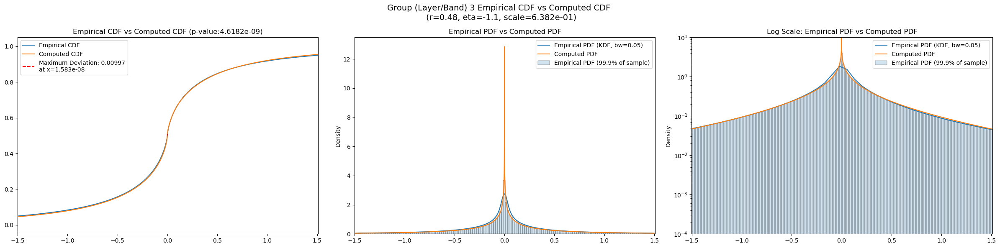

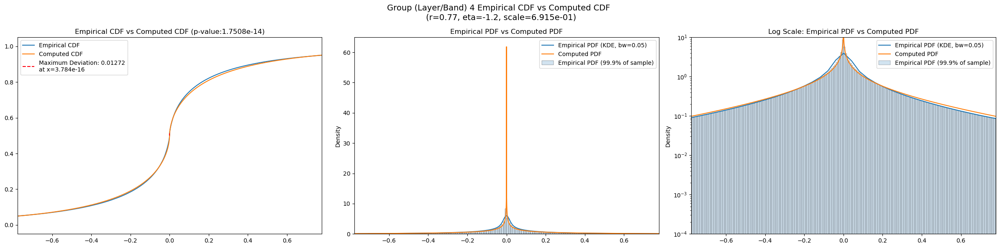

...

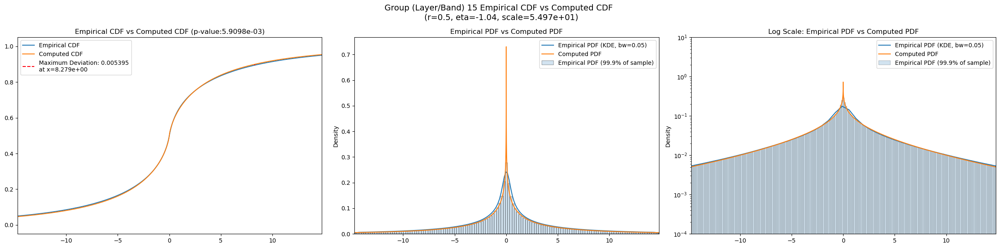

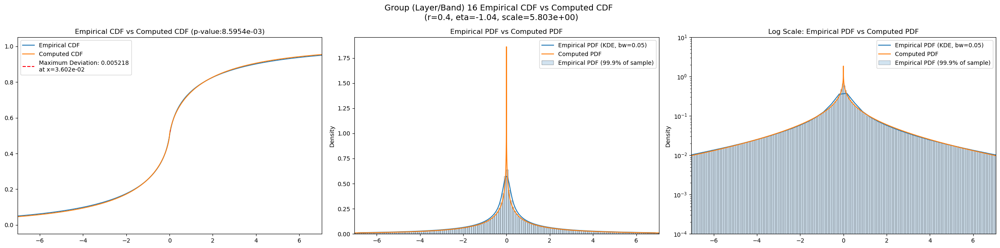

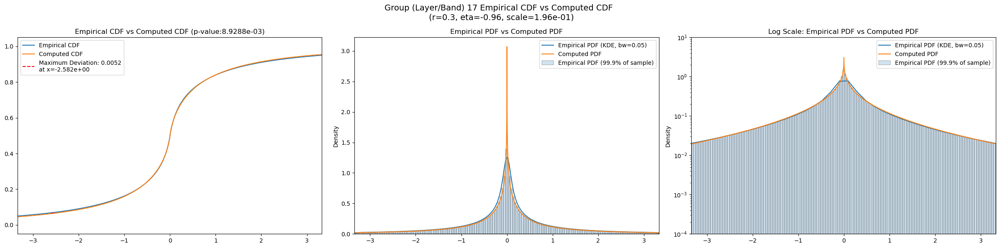

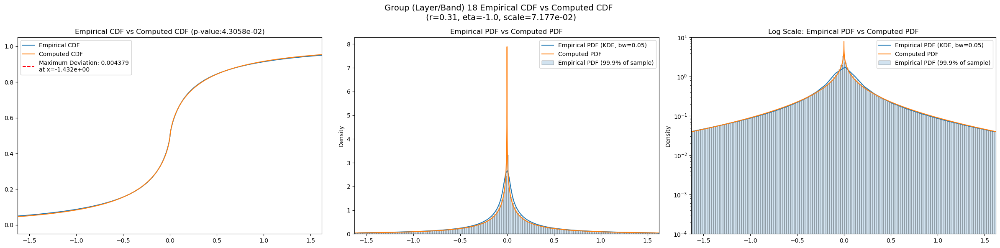

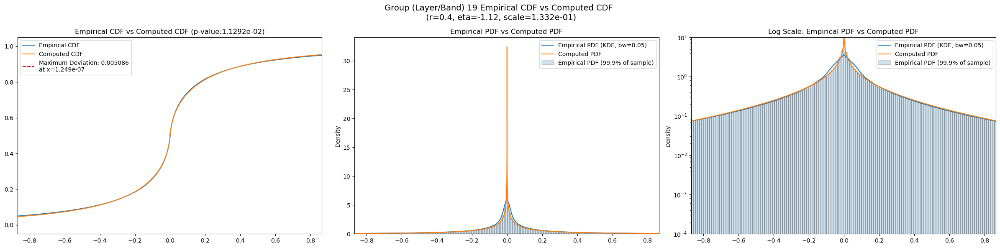

In [25]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = group)
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [26]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [27]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,63.548928,48.379970,80.931687,7.165057,3.826848,16.333108,196608000.0,"(2.0, 0.5, 0.001)",0.006296,0.7,...,4.091100,0.069920,0.0,3.511240,0.044111,0.0,2.776830,0.046757,0.0,0.0
1,16.307660,12.305715,21.730621,9.287096,4.682542,24.351610,196608000.0,"(2.0, 0.5, 0.002)",0.007764,0.6,...,1.849920,0.074679,0.0,1.585970,0.049273,0.0,1.244740,0.051374,0.0,0.0
2,4.202337,3.154458,5.660183,11.389939,5.542621,32.844753,196608000.0,"(2.0, 0.5, 0.003)",0.008365,0.4,...,0.875051,0.075652,0.0,0.750444,0.050321,0.0,0.588134,0.052264,0.0,0.0
3,1.123752,0.816141,1.521846,13.253161,6.340989,35.143394,196608000.0,"(2.0, 0.5, 0.004)",0.009970,0.5,...,0.426983,0.076470,0.0,0.366736,0.051194,0.0,0.286237,0.052721,0.0,0.0
4,0.309677,0.218014,0.412613,14.076481,7.350612,39.435435,196608000.0,"(2.0, 0.5, 0.005)",0.012722,0.4,...,0.207968,0.082043,0.0,0.177158,0.057473,0.0,0.138037,0.059298,0.0,0.0
5,96.367710,74.343195,121.855985,7.973325,3.719243,21.967798,196608000.0,"(2.0, 0.5, 0.009)",0.004501,0.6,...,5.346370,0.061981,0.0,4.612150,0.035686,0.0,3.650070,0.038617,0.0,0.0
6,24.910594,18.300485,33.594873,10.619910,5.240451,35.423319,196608000.0,"(2.0, 0.5, 0.014)",0.006415,0.7,...,2.370820,0.069284,0.0,2.036510,0.043657,0.0,1.601930,0.045909,0.0,0.0
7,6.427431,4.737144,8.874136,13.242025,6.263086,43.162268,196608000.0,"(2.0, 0.5, 0.022)",0.006669,0.4,...,1.093260,0.072309,0.0,0.937026,0.046992,0.0,0.736125,0.049214,0.0,0.0
8,1.678274,1.163611,2.391877,15.821607,6.910286,52.082524,196608000.0,"(2.0, 0.5, 0.034)",0.008010,0.4,...,0.522603,0.073648,0.0,0.448551,0.048256,0.0,0.351675,0.050242,0.0,0.0


## Results

In [28]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [29]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.006296,0.000097,0.005499,0.069920,0.044111,0.046757
1,0.007764,0.000097,0.007101,0.074679,0.049273,0.051374
2,0.008365,0.000097,0.007365,0.075652,0.050321,0.052264
3,0.009970,0.000097,0.009970,0.076470,0.051194,0.052721
4,0.012722,0.000097,0.012720,0.082043,0.057473,0.059298
5,0.004501,0.000097,0.004355,0.061981,0.035686,0.038617
6,0.006415,0.000097,0.003775,0.069284,0.043657,0.045909
7,0.006669,0.000097,0.006299,0.072309,0.046992,0.049214
8,0.008010,0.000097,0.008010,0.073648,0.048256,0.050242


In [30]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,63.548928,0.005499,0.74,-1.10,108.886015,0.0
1,15.140806,0.007101,0.63,-1.10,19.197756,75.0
2,4.202337,0.007365,0.40,-1.01,0.892334,0.0
3,1.048596,0.009970,0.48,-1.10,0.638241,50.0
4,0.275061,0.012720,0.77,-1.20,0.691507,100.0
5,96.367710,0.004355,0.62,-1.00,88.629111,0.0
6,24.910594,0.003775,0.50,-1.03,13.660119,0.0
7,5.849491,0.006299,0.50,-1.05,3.420755,75.0
8,1.444662,0.008010,0.56,-1.10,1.386687,125.0
